# Credit Card Users Churn Prediction

## **Table of Contents**

1. [Problem Statement](#1)
    * 1.1. [Business Content](#1.1)
    * 1.2. [Data Description](#1.2)
2.  [Libraries](#2)
3.  [Dataset](#3)
4.  [Data Overview](#4)
5.  [Exploratory Data Anaylsis](#5)
    * 5.1. [Initial Overview](#5.1)
    * 5.2. [Univariate Analysis](#5.2)
    * 5.3. [Bivariate Analysis (`Attrition_Flag` versus)](#5.3)
6.  [Data Pre-processing](#6)
    * 6.1 [Missing Value Imputation](#6.1)
    * 6.2 [Dropping Columns](#6.2)
    * 6.3 [Treating Outliers](#6.3)
7.  [Model Building](#7)
    * 7.1 [With Original Data](#7.1)
    * 7.2 [With Oversampled Data](#7.2)
    * 7.3 [With Undersampled Data](#7.3)
8.  [Hyperparameter Tuning](#8)
9.  [Model Comparison and Final Model Selection](#9)
    * 9.1 [Test Set Final Performance](#9.1)
10. [Business Insights and Conclusions](#10)

<a id=1></a>
## Problem Statement


<a id=1.1></a>
### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

<a id=1.2></a>
### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

<a id=2></a>
## Importing necessary libraries

In this section, we need to consolidate all necessary libraries that will be used. This includes all that are needed for data analysis (e.g., pandas, numpy), data visualization (plotly), and for modeling (e.g., sci-kit learn).

For this project, we're required to develop 5 models. The classification models that I've chosen are:
1. Bagging
2. Random Forest
3. Adaptive Boost
4. Extreme Gradient Boost (XGBoost)
5. Stacking 

In [158]:
import warnings
warnings.filterwarnings("ignore")
import os

# data and analysis libraries
import pandas as pd
import numpy as np
from sklearn import metrics
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import scipy.stats as stats
from scipy.stats import uniform, randint

#import data visualization libraries
import plotly.express as px
from scipy.stats import skew
import plotly.graph_objects as go

#model libraries
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, cross_val_predict
from sklearn import metrics
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
)

# data preprocessing libraries
# To be used for data scaling and encoding
from sklearn.preprocessing import (
    StandardScaler,
    MinMaxScaler,
    OneHotEncoder,
    RobustScaler,
)

# 5 models to be used: BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, XGBoost, Stacking
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier

#hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV
import optuna

# oversampling and undersampling data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

#data treatment library
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder

# ability to import from github repository
import certifi
import ssl

ssl._create_default_https_context = ssl._create_unverified_context

<a id=3></a>
## Loading the dataset

Loading the dataset. Choosing different varieties of sources, including learning how to leverage data from a SQL database, and utilizing GitHub.

In [159]:
url = "https://raw.githubusercontent.com/wesliejh/Project-3---Credit-Card-Churn/main/BankChurners.csv"
bank_data = pd.read_csv(url)

In [160]:
data = bank_data.copy()

<a id=4></a>
## Data Overview

In [161]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [162]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [163]:
data.shape

(10127, 21)

**Observations**
- The dataset has 10127 rows, and 21 columns
- Attrition_Flag is the focus column we're building the model to predict. It is of the datatype `object`
- Other categorical columns include `Gender`, `Education_Level`, `Marital_Status`, `Income_Category`, and `Card_Category`
- `Education_Level`, and `Marital_Status` have missing values.

In [164]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10127.0,4.632596e+01,8.016814e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


<a id=5></a>
## Exploratory Data Analysis (EDA)

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



#### The below functions need to be defined to carry out the Exploratory Data Analysis.

In [165]:
# function to plot a boxplot and a histogram along the same scale.
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [166]:
# function to create labeled barplots
def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [167]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [168]:
### Function to plot distributions

def distribution_plot(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

<a id=5.1></a>
#### Initial Overview
* Check for duplicates
* Check for null values

In [169]:
data.duplicated().sum()

0

In [170]:
data.isnull().sum()/len(data)*100

CLIENTNUM                    0.000000
Attrition_Flag               0.000000
Customer_Age                 0.000000
Gender                       0.000000
Dependent_count              0.000000
Education_Level             14.999506
Marital_Status               7.396070
Income_Category              0.000000
Card_Category                0.000000
Months_on_book               0.000000
Total_Relationship_Count     0.000000
Months_Inactive_12_mon       0.000000
Contacts_Count_12_mon        0.000000
Credit_Limit                 0.000000
Total_Revolving_Bal          0.000000
Avg_Open_To_Buy              0.000000
Total_Amt_Chng_Q4_Q1         0.000000
Total_Trans_Amt              0.000000
Total_Trans_Ct               0.000000
Total_Ct_Chng_Q4_Q1          0.000000
Avg_Utilization_Ratio        0.000000
dtype: float64

* No duplicated data
* `Education_Level` and `Marital_Status` have 15%, and 7% missing, respectively 

<a id=5.2></a>
#### Univariate Analysis Preview

In [171]:
# create variable for only number dtypes
data_int = data.select_dtypes(include='number')
#create variable for all other dtypes
data_cat = data.select_dtypes(exclude='number')

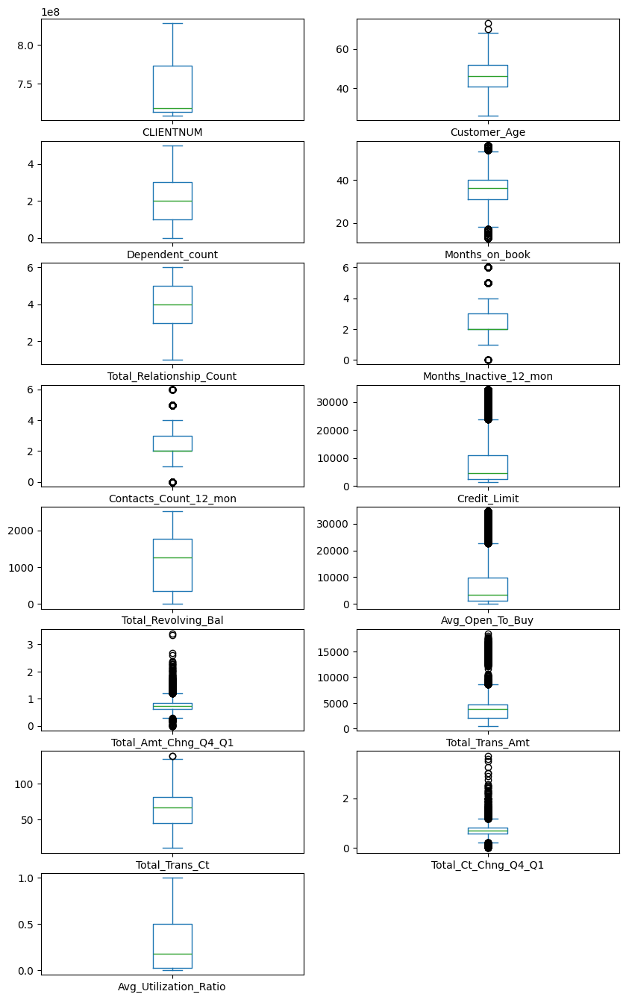

In [172]:
data.plot(kind = 'box', subplots=True, figsize = (10,40), layout = (19,2), sharex=False, sharey = False)
plt.show();

**Observations**
- Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Ct_Chng_Q4_Q1, Avg_Open_To_Buy, Credit_Limit, and Months_on_Book all have numerous outliers
    - Total_Trans_Ct, Contacts_Count_12_mon, and Months_Inactive_12_mon have outliers, but not many

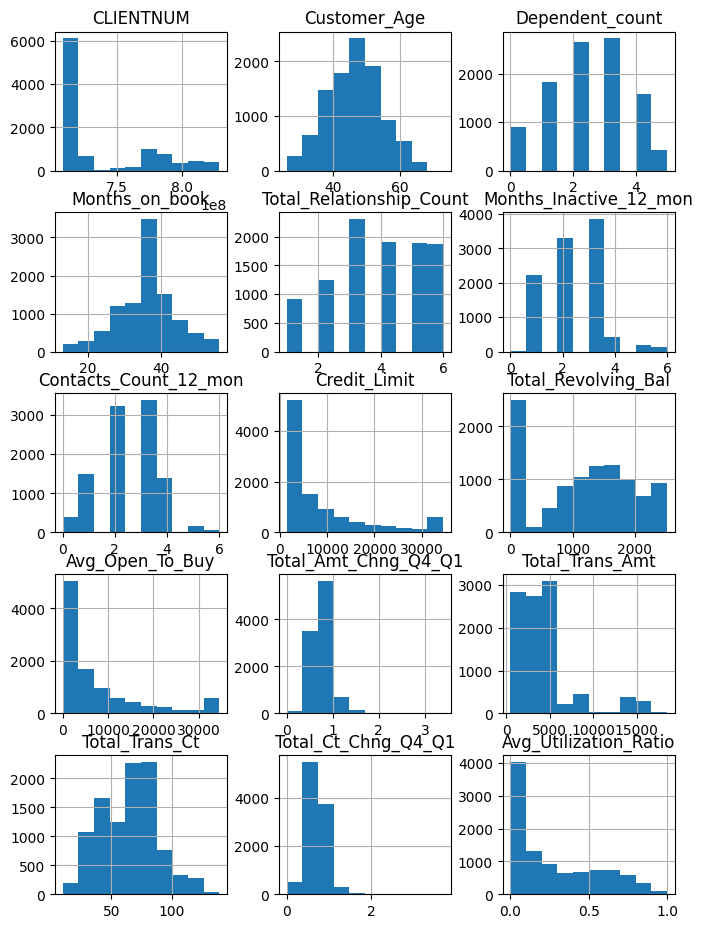

In [173]:
data_int.hist(layout = (13,3), figsize=(8, 30))
plt.show();

<a id=5.2.2></a>
## Categorical Data Review
- Attrition_Flag
- Gender
- Education_Level
- Marital_Status
- Income_Category
- Card_Category

##### `Attrition_Data`

In [174]:
data['Attrition_Flag'].value_counts()

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

In [175]:
data['Attrition_Flag'].value_counts()/len(data)*100

Attrition_Flag
Existing Customer    83.934038
Attrited Customer    16.065962
Name: count, dtype: float64

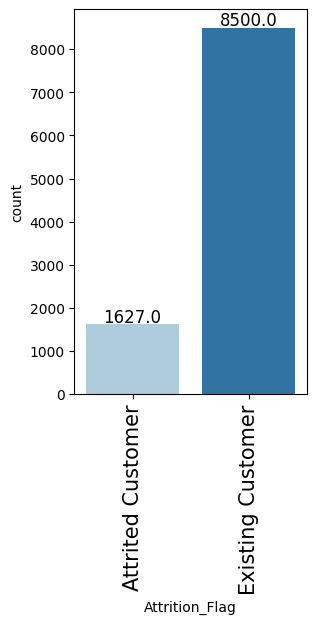

In [176]:
labeled_barplot(data, 'Attrition_Flag')

- Only about 16% of Customers have attrited.

#### `Gender`

In [177]:
data['Gender'].value_counts()

Gender
F    5358
M    4769
Name: count, dtype: int64

In [178]:
data['Gender'].value_counts()/len(data)*100

Gender
F    52.908068
M    47.091932
Name: count, dtype: float64

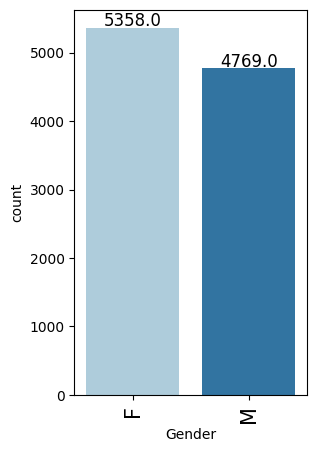

In [179]:
labeled_barplot(data, 'Gender')

- Company has more women than men. Will be interested in bivariate analysis the split between attrition versus gender

#### `Education_Level`

In [180]:
data['Education_Level'].value_counts()

Education_Level
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64

In [181]:
data['Education_Level'].value_counts()/len(data)*100

Education_Level
Graduate         30.887726
High School      19.877555
Uneducated       14.683519
College          10.002962
Post-Graduate     5.095290
Doctorate         4.453441
Name: count, dtype: float64

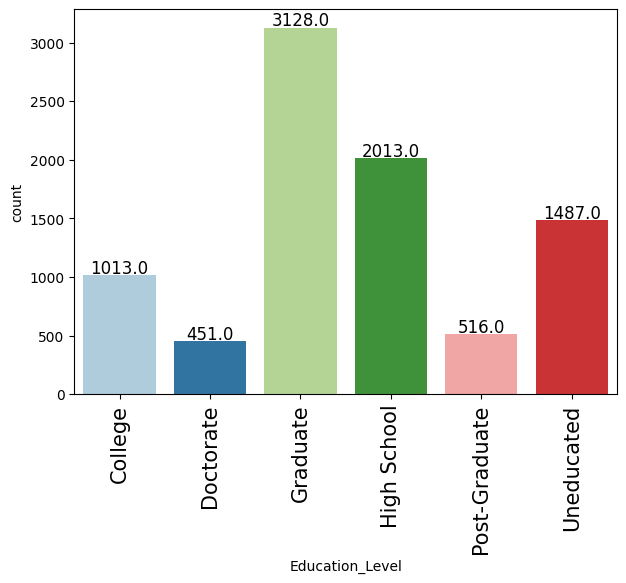

In [182]:
labeled_barplot(data, 'Education_Level')

* Will likely leave the categories as untreated (e.g., consolidation between highschool, undergraduate, postgrad)
* Will be an option to consolidate if there is too many categories amongst `Education_Level`

#### `Marital_Status`

In [183]:
data['Marital_Status'].value_counts()

Marital_Status
Married     4687
Single      3943
Divorced     748
Name: count, dtype: int64

In [184]:
data['Marital_Status'].value_counts()/len(data)*100

Marital_Status
Married     46.282216
Single      38.935519
Divorced     7.386195
Name: count, dtype: float64

In [185]:
data['Marital_Status'].unique()

array(['Married', 'Single', nan, 'Divorced'], dtype=object)

In [186]:
data['Marital_Status'].isnull().sum()/len(data)*100

7.3960699121161255

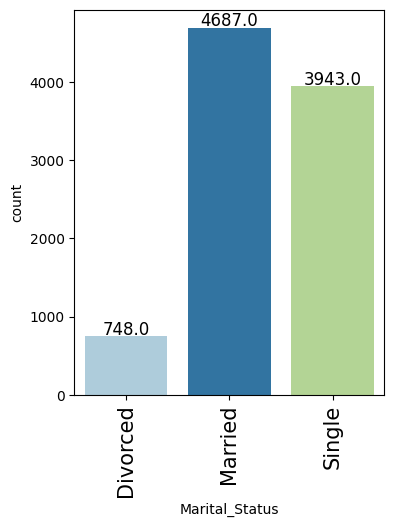

In [187]:
labeled_barplot(data, 'Marital_Status')

* About 7.4% of values are missing from this data, and will need treatment 

#### `Income_Category`

In [188]:
data['Income_Category'].value_counts()

Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: count, dtype: int64

In [189]:
data['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', 'abc'], dtype=object)

In [190]:
data['Income_Category'].value_counts()/len(data)*100

Income_Category
Less than $40K    35.163425
$40K - $60K       17.675521
$80K - $120K      15.157500
$60K - $80K       13.844179
abc               10.980547
$120K +            7.178829
Name: count, dtype: float64

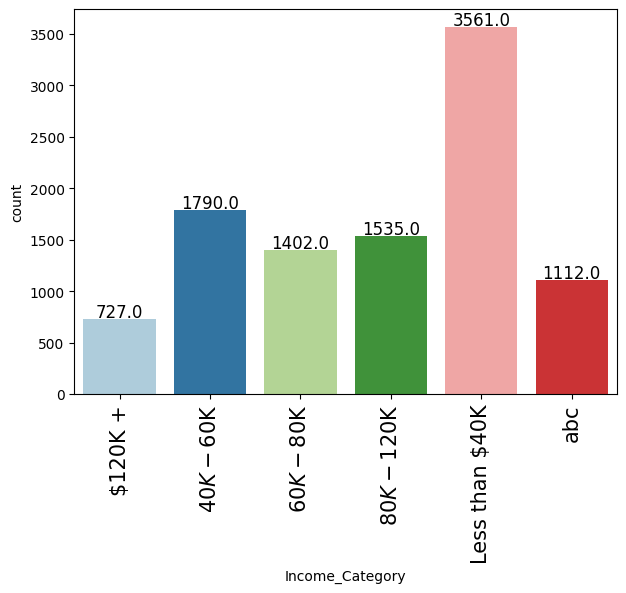

In [191]:
labeled_barplot(data, 'Income_Category')

* ~11% of the dataset is mislabelled as 'abc'. Will need to inspect to see if that can be corrected in relation to another category.
* a majority of Customers make under $60k

#### `Card_Category`

In [192]:
data['Card_Category'].value_counts()

Card_Category
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: count, dtype: int64

<a id=5.2.3></a>
## Numerical Data Review
* CLIENTNUM (int64)
* Customer_Age (int64)
* Dependent_count (int64)
* Months_on_book (int64)
* Total_Relationship_Count (int64)
* Months_Inactive_12_mon (int64)
* Contacts_Count_12_mon (int64)
* Credit_Limit (float64)
* Total_Revolving_Bal (int64)
* Avg_Open_To_Buy (float64)
* Total_Amt_Chng_Q4_Q1 (float64)
* Total_Trans_Amt (int64)
* Total_Trans_Ct (int64)
* Total_Ct_Chng_Q4_Q1 (float64)
* Avg_Utilization_Ratio (float64)

#### Creating a function for a Quick Review of Column Data

In [193]:
# creating function for a quick overview of data around the quartile information

def outlier_review(data, column):
    """
    Function to review outliers in a column

    data: dataframe
    column: column name
    """
    q1 = data[column].quantile(0.25)
    q3 = data[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)][column]
    
    num_above = data[data[column] > upper_bound].shape[0]
    num_below = data[data[column] < lower_bound].shape[0]
    
    
    print(
        "The number of outliers in "
        + column
        + " is "
        + str(data[(data[column] < lower_bound) | (data[column] > upper_bound)][
            column
        ].count())
    )
    print()
    print("The upperbound value is: ", upper_bound)
    print("The lowerbound value is: ", lower_bound)
    print()
    print("The number of points above the upper bound is " + str(num_above))
    print("The number of points below the lower bound is " + str(num_below))
    print()
    print("Quick overview of outliers:\n", outliers, sep="")

In [194]:
# creating a function for a quick data review of a specific column

def data_review(data, column):
    """
    Function to review data in a column

    data: dataframe
    column: column name
    """
    print("The number of missing values is: ", data[column].isnull().sum())
    print()
    print("The number of unique values is: ", data[column].nunique())
    print()
    print("The data type is: ", data[column].dtype)
    print()
    print("The data description: \n", data[column].describe().T, sep="")
    print()
    print("The percentage of data points amongst the column is:\n", data[column].value_counts()/len(data)*100) 

In [195]:
def review(data, column):
    histogram_boxplot(data, column)
    outlier_review(data, column)
    data_review(data, column)
    
    skewness = skew(data[column])
    print(f"Skewness of {column}: {skewness}")

#### `CLIENTNUM`

In [196]:
data['CLIENTNUM'].nunique()

10127

* We can see that `CLIENTNUM` has the same amonut of unique values as the number of rows in `data`
* We'll drop this during pre-processing

In [197]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

* Confirming it `CLIENTNUM` was dropped by reviewing info

#### `Customer_Age`

The number of outliers in Customer_Age is 2

The upperbound value is:  68.5
The lowerbound value is:  24.5

The number of points above the upper bound is 2
The number of points below the lower bound is 0

Quick overview of outliers:
251    73
254    70
Name: Customer_Age, dtype: int64
The number of missing values is:  0

The number of unique values is:  45

The data type is:  int64

The data description: 
count    10127.000000
mean        46.325960
std          8.016814
min         26.000000
25%         41.000000
50%         46.000000
75%         52.000000
max         73.000000
Name: Customer_Age, dtype: float64

The percentage of data points amongst the column is:
 Customer_Age
44    4.937296
49    4.887923
46    4.838550
45    4.799052
47    4.729930
43    4.670682
48    4.660808
50    4.463316
42    4.206576
51    3.930088
53    3.821467
41    3.742471
52    3.712847
40    3.564728
39    3.288239
54    3.031500
38    2.992002
55    2.755011
56    2.587143
37    2.567394
57    2.2020

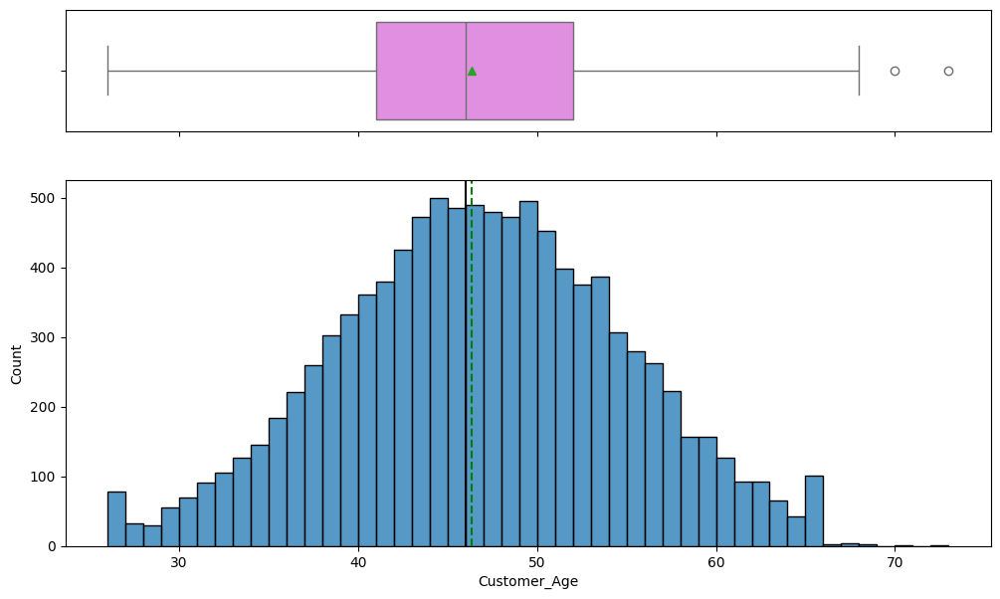

In [198]:
review(data, 'Customer_Age')

* Has a normal distribution where the mean and median are closely aligned
* Has only 2 points that exceed the upper_bound of 68.5, which are the ages of 70 and 73, and both are existing Customers.
* After review, we should be able to safely adjust the ages to the Upper_Bound, as they are only 2 data points and are both existing Customers

#### `Dependent_count`

The number of outliers in Dependent_count is 0

The upperbound value is:  6.0
The lowerbound value is:  -2.0

The number of points above the upper bound is 0
The number of points below the lower bound is 0

Quick overview of outliers:
Series([], Name: Dependent_count, dtype: int64)
The number of missing values is:  0

The number of unique values is:  6

The data type is:  int64

The data description: 
count    10127.000000
mean         2.346203
std          1.298908
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          5.000000
Name: Dependent_count, dtype: float64

The percentage of data points amongst the column is:
 Dependent_count
3    26.977387
2    26.217044
1    18.149501
4    15.542609
0     8.926632
5     4.186827
Name: count, dtype: float64
Skewness of Dependent_count: -0.02082245083419453


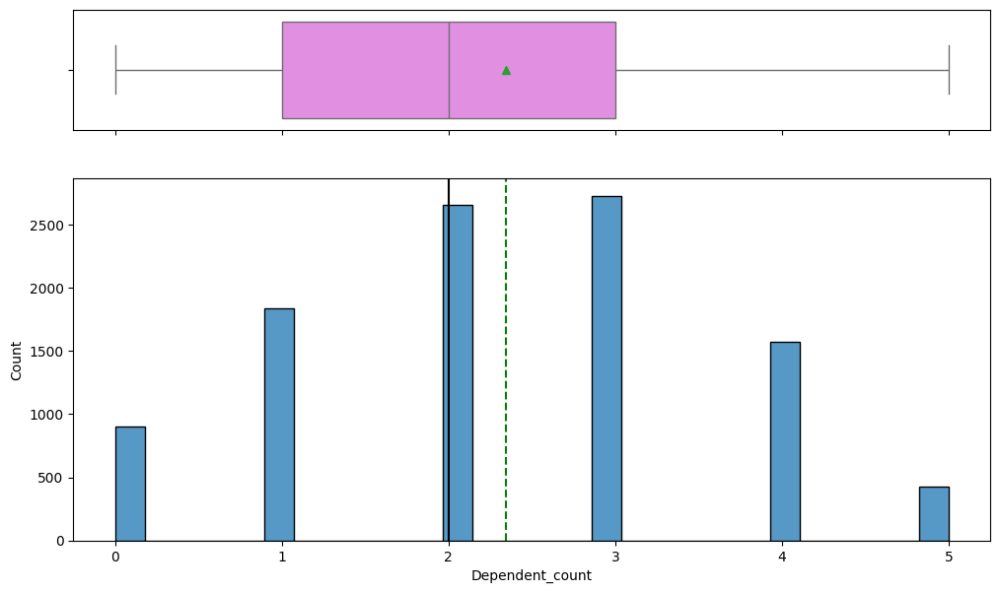

In [199]:
review(data, 'Dependent_count')

* Normal distribtuion amongs the dependent values
* A majority of Customers have 2 to 3, with nearly 75% having 2 or greater dependents

#### `Months_on_book`

The number of outliers in Months_on_book is 386

The upperbound value is:  53.5
The lowerbound value is:  17.5

The number of points above the upper bound is 198
The number of points below the lower bound is 188

Quick overview of outliers:
11       54
18       56
27       56
39       56
52       54
         ..
10054    15
10062    17
10069    14
10107    54
10114    15
Name: Months_on_book, Length: 386, dtype: int64
The number of missing values is:  0

The number of unique values is:  44

The data type is:  int64

The data description: 
count    10127.000000
mean        35.928409
std          7.986416
min         13.000000
25%         31.000000
50%         36.000000
75%         40.000000
max         56.000000
Name: Months_on_book, dtype: float64

The percentage of data points amongst the column is:
 Months_on_book
36    24.321122
37     3.535104
34     3.485731
38     3.426484
39     3.367236
40     3.288239
31     3.140120
35     3.130246
33     3.011751
30     2.962378
41     2.9327

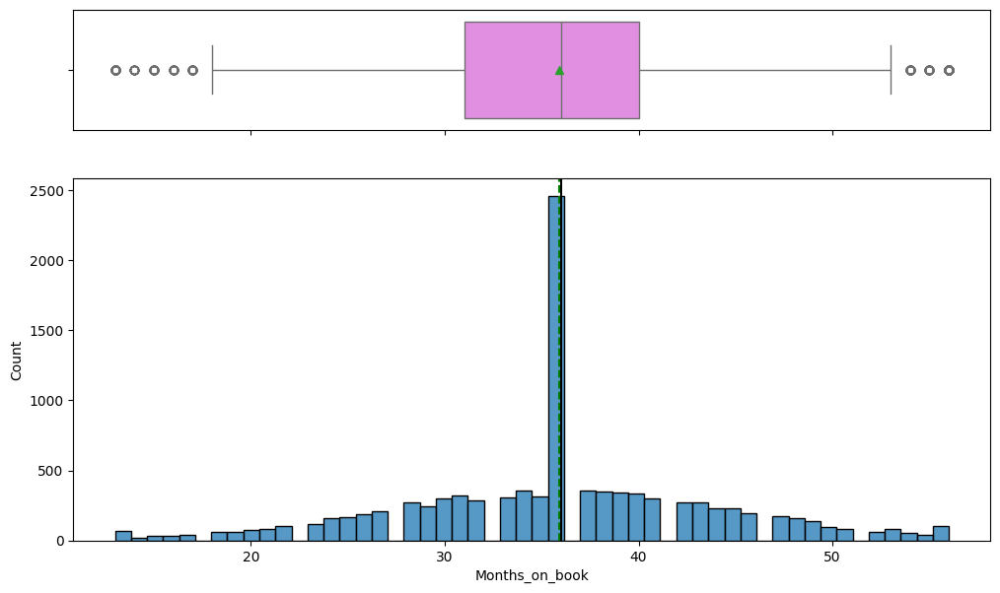

In [200]:
review(data, 'Months_on_book')

* Mean and median for Months_on_book are very similar, which indicates a normal distribution
* There are roughly the same amount of outliers above the upperbound and lowerbound, which may indiacte treatment will not be necessary since there is no strong bias in either direction 

#### `Total_Relationship_Count`

The number of outliers in Total_Relationship_Count is 0

The upperbound value is:  8.0
The lowerbound value is:  0.0

The number of points above the upper bound is 0
The number of points below the lower bound is 0

Quick overview of outliers:
Series([], Name: Total_Relationship_Count, dtype: int64)
The number of missing values is:  0

The number of unique values is:  6

The data type is:  int64

The data description: 
count    10127.000000
mean         3.812580
std          1.554408
min          1.000000
25%          3.000000
50%          4.000000
75%          5.000000
max          6.000000
Name: Total_Relationship_Count, dtype: float64

The percentage of data points amongst the column is:
 Total_Relationship_Count
3    22.760936
4    18.880221
5    18.672855
6    18.425990
2    12.274119
1     8.985879
Name: count, dtype: float64
Skewness of Total_Relationship_Count: -0.16242835172024658


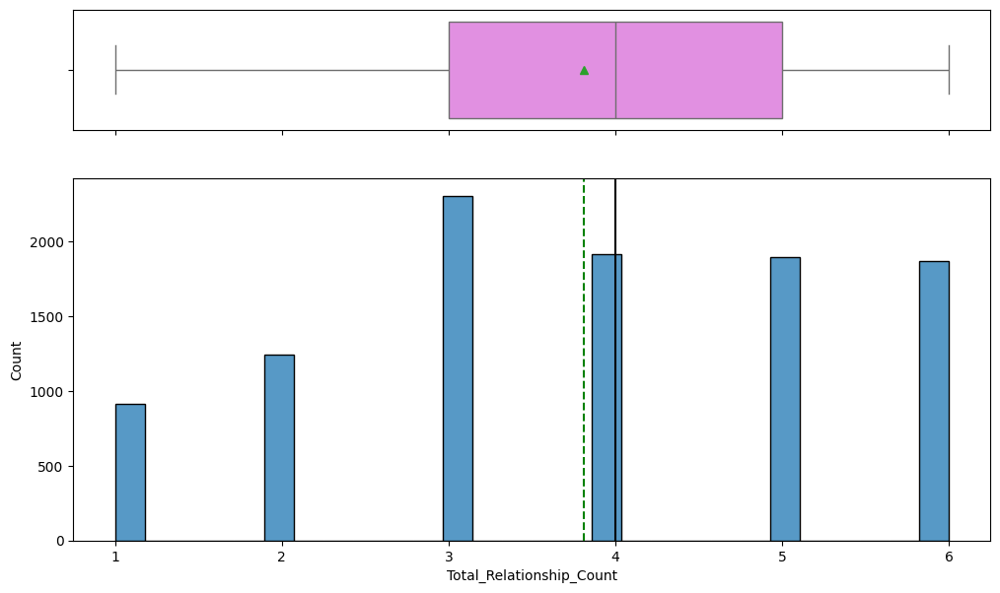

In [201]:
review(data, 'Total_Relationship_Count')

* Fairly uniform distribution amongst values >=3 products held by the Customer
* Would like to understand how this data point is related to Customer attrition in bivariate review

#### `Months_Inactive_12_mon`

The number of outliers in Months_Inactive_12_mon is 331

The upperbound value is:  4.5
The lowerbound value is:  0.5

The number of points above the upper bound is 302
The number of points below the lower bound is 29

Quick overview of outliers:
12       6
29       0
31       5
108      0
118      6
        ..
9964     5
10028    5
10035    6
10049    5
10066    6
Name: Months_Inactive_12_mon, Length: 331, dtype: int64
The number of missing values is:  0

The number of unique values is:  7

The data type is:  int64

The data description: 
count    10127.000000
mean         2.341167
std          1.010622
min          0.000000
25%          2.000000
50%          2.000000
75%          3.000000
max          6.000000
Name: Months_Inactive_12_mon, dtype: float64

The percentage of data points amongst the column is:
 Months_Inactive_12_mon
3    37.977683
2    32.408413
1    22.049965
4     4.295448
5     1.757677
6     1.224449
0     0.286363
Name: count, dtype: float64
Skewness of Months_Inac

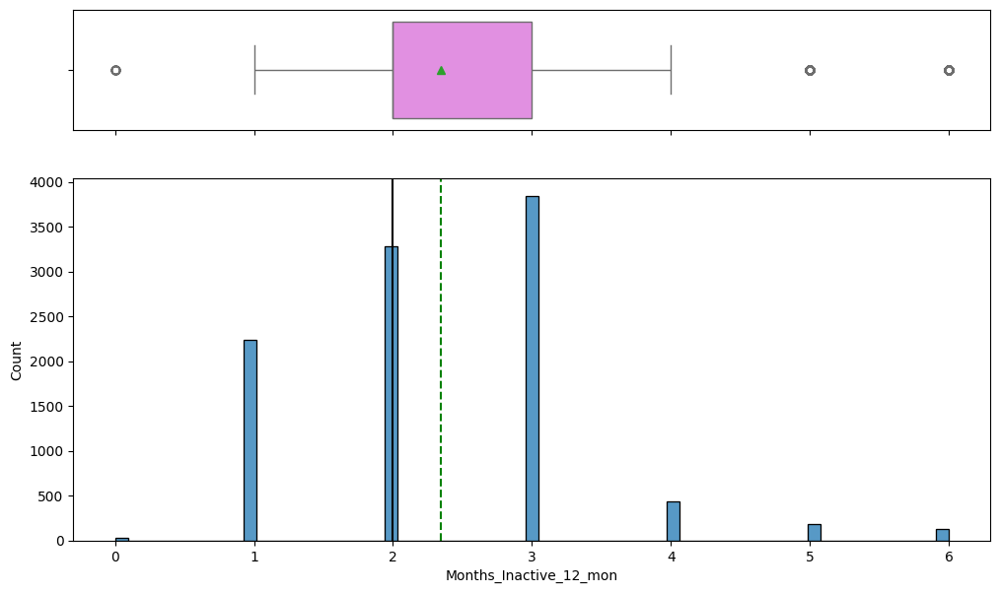

In [202]:
review(data, 'Months_Inactive_12_mon')

* The graph shows a heavy bias towards the left, indicating right-skewedness
* There's an average of 2.3 months of inactivity, where the median is 2 months

#### `Contacts_Count_12_mon`

The number of outliers in Contacts_Count_12_mon is 629

The upperbound value is:  4.5
The lowerbound value is:  0.5

The number of points above the upper bound is 230
The number of points below the lower bound is 399

Quick overview of outliers:
2        0
4        0
8        0
12       0
20       0
        ..
10101    5
10106    5
10109    5
10114    5
10120    0
Name: Contacts_Count_12_mon, Length: 629, dtype: int64
The number of missing values is:  0

The number of unique values is:  7

The data type is:  int64

The data description: 
count    10127.000000
mean         2.455317
std          1.106225
min          0.000000
25%          2.000000
50%          2.000000
75%          3.000000
max          6.000000
Name: Contacts_Count_12_mon, dtype: float64

The percentage of data points amongst the column is:
 Contacts_Count_12_mon
3    33.376123
2    31.865311
1    14.802014
4    13.745433
0     3.939962
5     1.737928
6     0.533228
Name: count, dtype: float64
Skewness of Contacts_Count

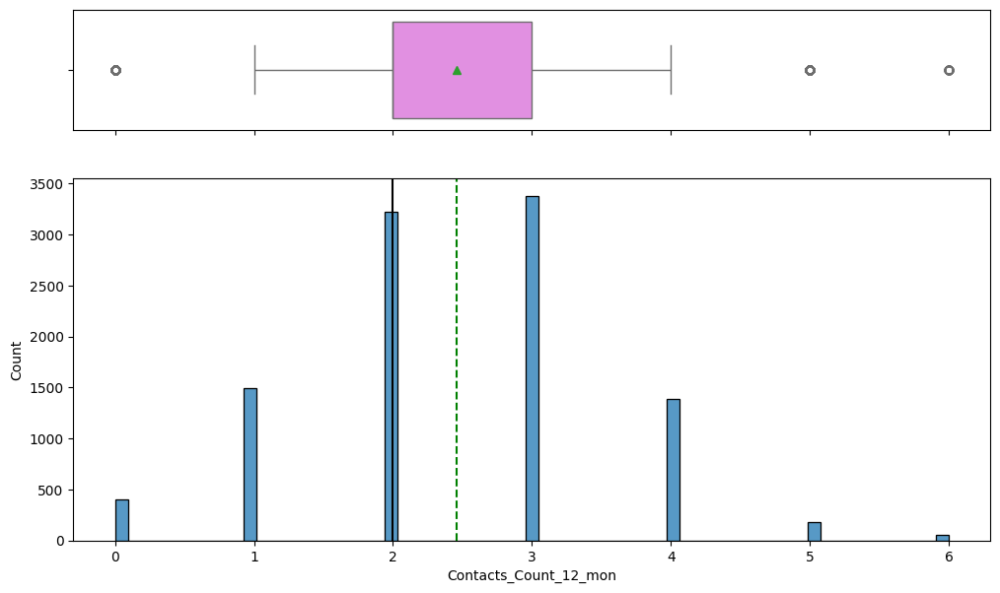

In [203]:
review(data, 'Contacts_Count_12_mon')

* Despite there being a number of outliers, the distribution is normal
* Most of the outliers are '0' meaning that there has been no contact with the Company
* With a small variety of data points, will need to be careful in treating outliers

#### `Credit_Limit`

The number of outliers in Credit_Limit is 984

The upperbound value is:  23836.25
The lowerbound value is:  -10213.75

The number of points above the upper bound is 984
The number of points below the lower bound is 0

Quick overview of outliers:
6        34516.0
7        29081.0
16       30367.0
40       32426.0
45       34516.0
          ...   
10098    34516.0
10100    29808.0
10104    29663.0
10110    34516.0
10112    34516.0
Name: Credit_Limit, Length: 984, dtype: float64
The number of missing values is:  0

The number of unique values is:  6205

The data type is:  float64

The data description: 
count    10127.000000
mean      8631.953698
std       9088.776650
min       1438.300000
25%       2555.000000
50%       4549.000000
75%      11067.500000
max      34516.000000
Name: Credit_Limit, dtype: float64

The percentage of data points amongst the column is:
 Credit_Limit
34516.0    5.016293
1438.3     5.006418
9959.0     0.177743
15987.0    0.177743
23981.0    0.118495
             

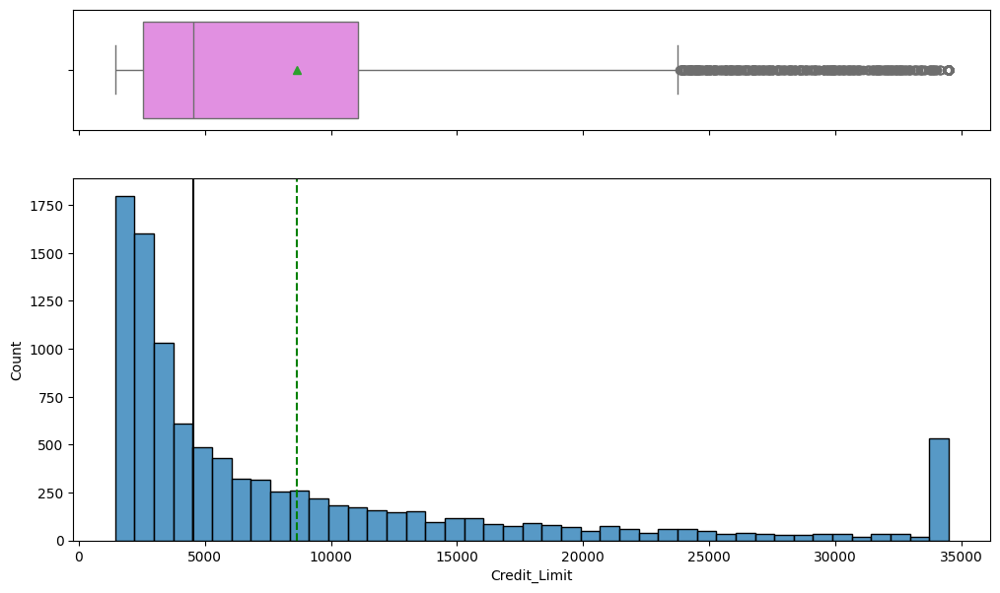

In [204]:
review(data, 'Credit_Limit')

* Heavily right skewed
* There are nearly 1,000 outliers above the upperbound. Most of which appear to be around the $34k credit limit.
* Needs to be treated, which will require more in depth review

#### `Total_Revolving_Bal`

The number of outliers in Total_Revolving_Bal is 0

The upperbound value is:  3921.5
The lowerbound value is:  -1778.5

The number of points above the upper bound is 0
The number of points below the lower bound is 0

Quick overview of outliers:
Series([], Name: Total_Revolving_Bal, dtype: int64)
The number of missing values is:  0

The number of unique values is:  1974

The data type is:  int64

The data description: 
count    10127.000000
mean      1162.814061
std        814.987335
min          0.000000
25%        359.000000
50%       1276.000000
75%       1784.000000
max       2517.000000
Name: Total_Revolving_Bal, dtype: float64

The percentage of data points amongst the column is:
 Total_Revolving_Bal
0       24.390244
2517     5.016293
1965     0.118495
1480     0.118495
1434     0.108621
          ...    
2467     0.009875
2131     0.009875
2400     0.009875
2144     0.009875
2241     0.009875
Name: count, Length: 1974, dtype: float64
Skewness of Total_Revolving_Bal: -0.148815203

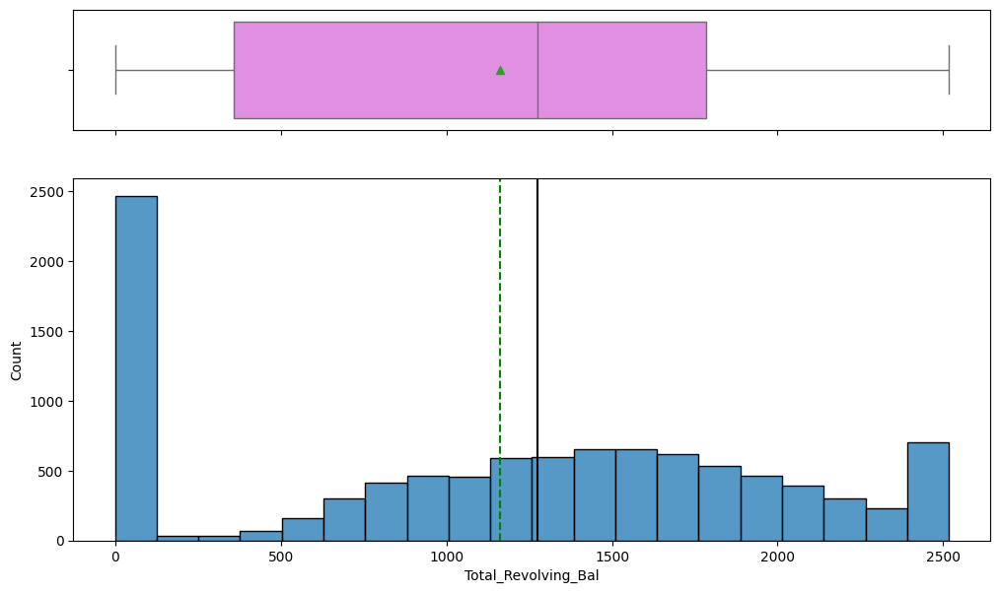

In [205]:
review(data, 'Total_Revolving_Bal')

* Slight left skewness
* No outliers to treat
* Majority of Customers have a $0 balance, but this may cause issues in classifying data. Needs to be kept an eye on.

##### `Avg_Open_To_Buy`

The number of outliers in Avg_Open_To_Buy is 963

The upperbound value is:  22660.75
The lowerbound value is:  -11477.25

The number of points above the upper bound is 963
The number of points below the lower bound is 0

Quick overview of outliers:
6        32252.0
7        27685.0
16       28005.0
40       31848.0
45       34516.0
          ...   
10100    29808.0
10103    22754.0
10104    27920.0
10110    33425.0
10112    34516.0
Name: Avg_Open_To_Buy, Length: 963, dtype: float64
The number of missing values is:  0

The number of unique values is:  6813

The data type is:  float64

The data description: 
count    10127.000000
mean      7469.139637
std       9090.685324
min          3.000000
25%       1324.500000
50%       3474.000000
75%       9859.000000
max      34516.000000
Name: Avg_Open_To_Buy, dtype: float64

The percentage of data points amongst the column is:
 Avg_Open_To_Buy
1438.3     3.199368
34516.0    0.967710
31999.0    0.256739
787.0      0.078997
701.0      0.069122
 

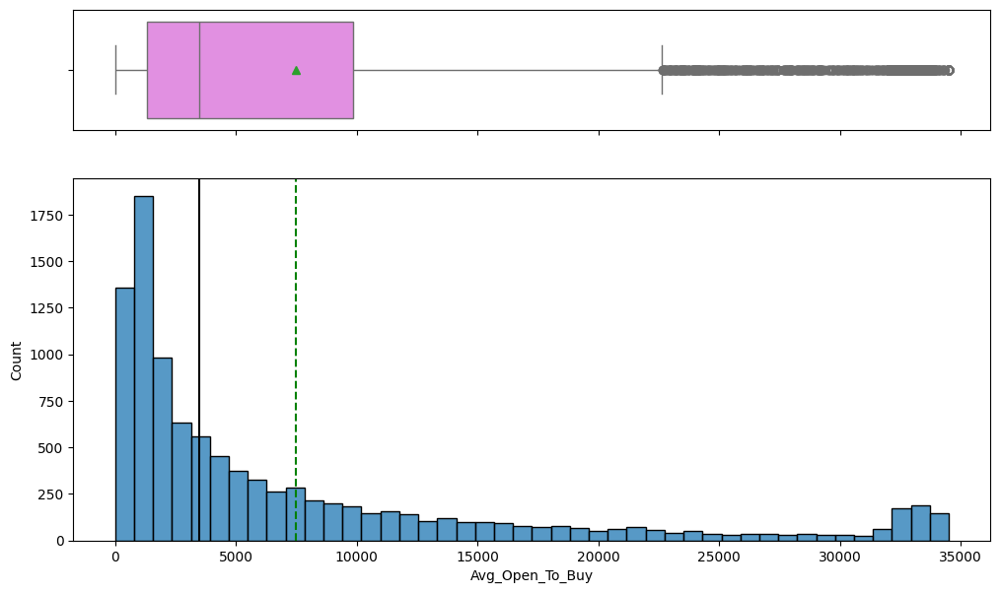

In [206]:
review(data, 'Avg_Open_To_Buy')

* There's 963 outliers that are all above teh upper bound value of $22,660
* strong right skewness

#### `Total_Amt_Chng_Q4_Q1`

The number of outliers in Total_Amt_Chng_Q4_Q1 is 396

The upperbound value is:  1.201
The lowerbound value is:  0.28900000000000003

The number of points above the upper bound is 348
The number of points below the lower bound is 48

Quick overview of outliers:
0        1.335
1        1.541
2        2.594
3        1.405
4        2.175
         ...  
9793     0.225
9808     0.202
9963     0.222
10008    0.204
10119    0.166
Name: Total_Amt_Chng_Q4_Q1, Length: 396, dtype: float64
The number of missing values is:  0

The number of unique values is:  1158

The data type is:  float64

The data description: 
count    10127.000000
mean         0.759941
std          0.219207
min          0.000000
25%          0.631000
50%          0.736000
75%          0.859000
max          3.397000
Name: Total_Amt_Chng_Q4_Q1, dtype: float64

The percentage of data points amongst the column is:
 Total_Amt_Chng_Q4_Q1
0.791    0.355485
0.712    0.335736
0.743    0.335736
0.718    0.325862
0.735    0.325862
     

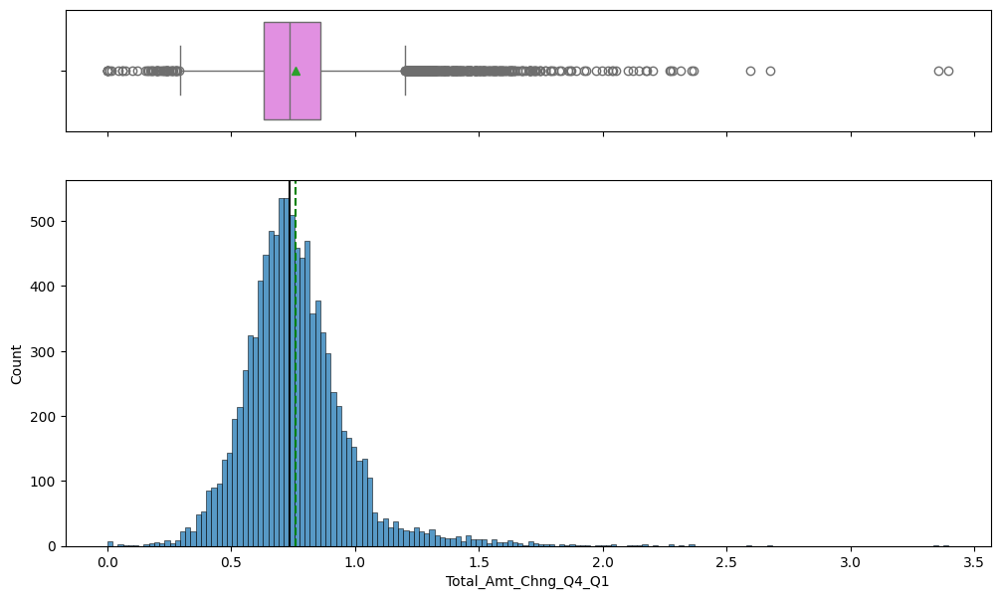

In [207]:
review(data, 'Total_Amt_Chng_Q4_Q1')

* Right skewed, with a large number of outliers
* mean and median is close together, so treatment of outliers may have minimal effect
* However, there is about 7 times more outliers of the upper than lower bound

#### `Total_Trans_Amt`

The number of outliers in Total_Trans_Amt is 896

The upperbound value is:  8619.25
The lowerbound value is:  -1722.75

The number of points above the upper bound is 896
The number of points below the lower bound is 0

Quick overview of outliers:
8591      8693
8650      8947
8670      8854
8708      8796
8734      8778
         ...  
10121    14596
10122    15476
10123     8764
10124    10291
10126    10294
Name: Total_Trans_Amt, Length: 896, dtype: int64
The number of missing values is:  0

The number of unique values is:  5033

The data type is:  int64

The data description: 
count    10127.000000
mean      4404.086304
std       3397.129254
min        510.000000
25%       2155.500000
50%       3899.000000
75%       4741.000000
max      18484.000000
Name: Total_Trans_Amt, dtype: float64

The percentage of data points amongst the column is:
 Total_Trans_Amt
4253     0.108621
4509     0.108621
4518     0.098746
2229     0.098746
4220     0.088871
           ...   
1274     0.009875
452

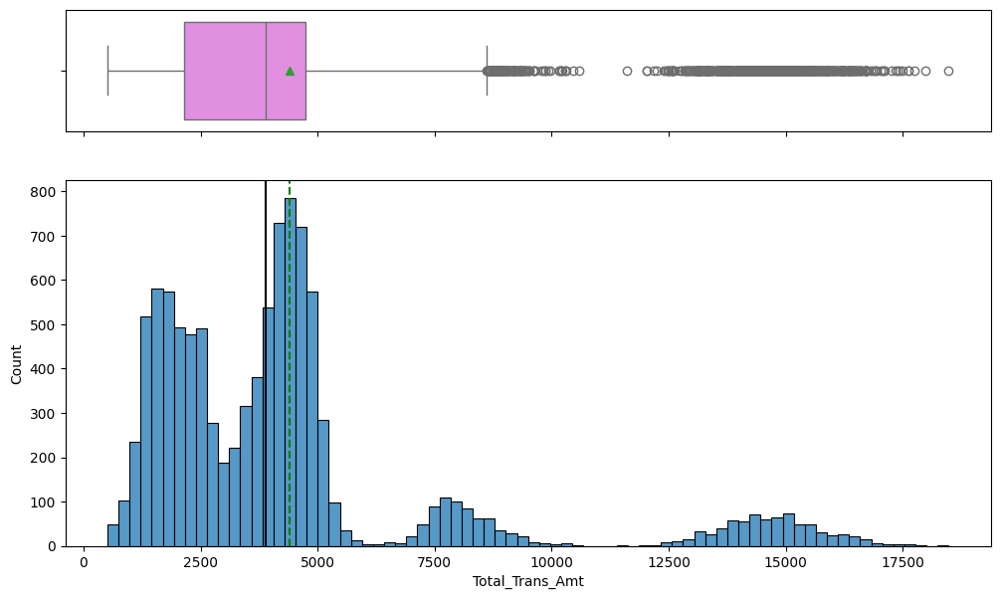

In [208]:
review(data, 'Total_Trans_Amt')

* All outliers are above the upperbound
* Heavily right skewed, but also could be interpreted as a non-symmetric bimodal distribution 

#### ` Total_Trans_Ct`

The number of outliers in Total_Trans_Ct is 2

The upperbound value is:  135.0
The lowerbound value is:  -9.0

The number of points above the upper bound is 2
The number of points below the lower bound is 0

Quick overview of outliers:
9324    139
9586    138
Name: Total_Trans_Ct, dtype: int64
The number of missing values is:  0

The number of unique values is:  126

The data type is:  int64

The data description: 
count    10127.000000
mean        64.858695
std         23.472570
min         10.000000
25%         45.000000
50%         67.000000
75%         81.000000
max        139.000000
Name: Total_Trans_Ct, dtype: float64

The percentage of data points amongst the column is:
 Total_Trans_Ct
81     2.053915
71     2.004542
75     2.004542
69     1.994668
82     1.994668
         ...   
11     0.019749
134    0.009875
139    0.009875
138    0.009875
132    0.009875
Name: count, Length: 126, dtype: float64
Skewness of Total_Trans_Ct: 0.1536503056777963


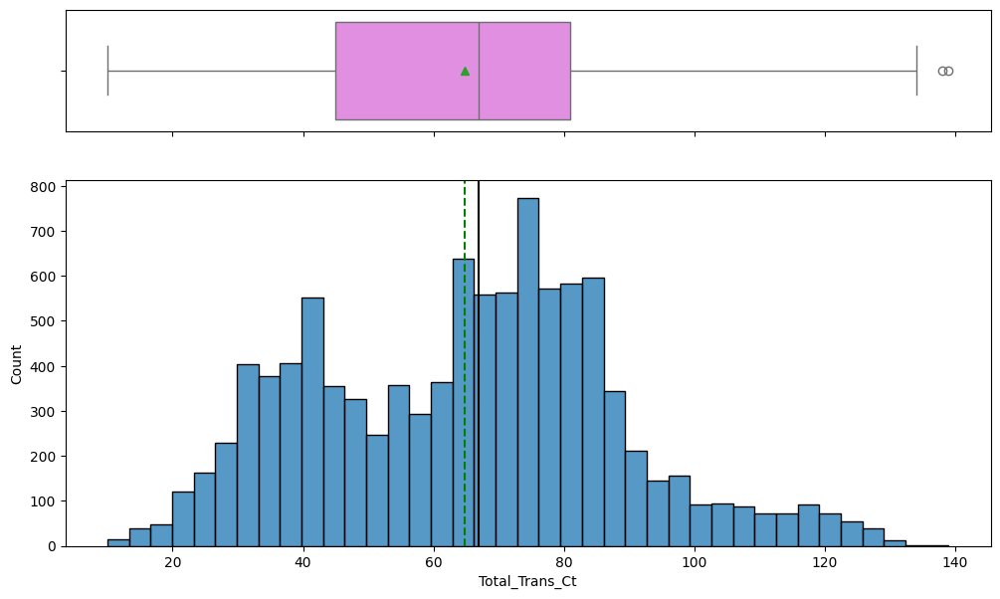

In [209]:
review(data, 'Total_Trans_Ct')

* There's only 2 values that are considered outliers
* Could potentially just leave them alone
* Right skewed

#### `Total_Ct_Chng_Q4_Q1`

The number of outliers in Total_Ct_Chng_Q4_Q1 is 394

The upperbound value is:  1.172
The lowerbound value is:  0.22799999999999998

The number of points above the upper bound is 298
The number of points below the lower bound is 96

Quick overview of outliers:
0       1.625
1       3.714
2       2.333
3       2.333
4       2.500
        ...  
9388    0.176
9672    1.294
9856    1.211
9917    1.207
9977    1.684
Name: Total_Ct_Chng_Q4_Q1, Length: 394, dtype: float64
The number of missing values is:  0

The number of unique values is:  830

The data type is:  float64

The data description: 
count    10127.000000
mean         0.712222
std          0.238086
min          0.000000
25%          0.582000
50%          0.702000
75%          0.818000
max          3.714000
Name: Total_Ct_Chng_Q4_Q1, dtype: float64

The percentage of data points amongst the column is:
 Total_Ct_Chng_Q4_Q1
0.667    1.688555
1.000    1.639182
0.500    1.589809
0.750    1.540436
0.600    1.115829
           ...   
0.8

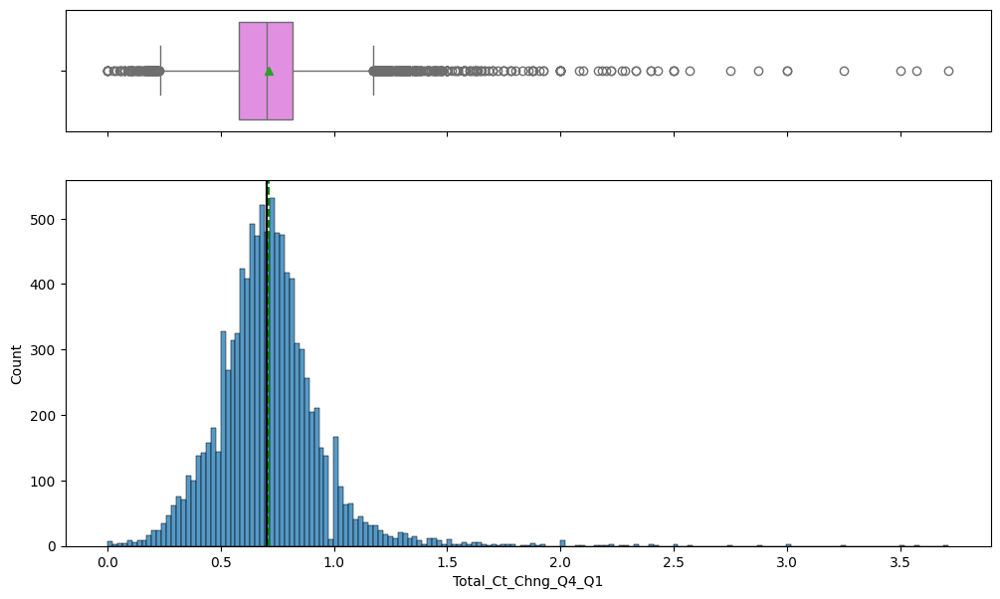

In [210]:
review(data, 'Total_Ct_Chng_Q4_Q1')

* Right skewed data
* 394 outliers with most being above the upper bound. Should require treatment

#### `Avg_Utilization_Ratio`

The number of outliers in Avg_Utilization_Ratio is 0

The upperbound value is:  1.2229999999999999
The lowerbound value is:  -0.697

The number of points above the upper bound is 0
The number of points below the lower bound is 0

Quick overview of outliers:
Series([], Name: Avg_Utilization_Ratio, dtype: float64)
The number of missing values is:  0

The number of unique values is:  964

The data type is:  float64

The data description: 
count    10127.000000
mean         0.274894
std          0.275691
min          0.000000
25%          0.023000
50%          0.176000
75%          0.503000
max          0.999000
Name: Avg_Utilization_Ratio, dtype: float64

The percentage of data points amongst the column is:
 Avg_Utilization_Ratio
0.000    24.390244
0.073     0.434482
0.057     0.325862
0.048     0.315987
0.060     0.296238
           ...    
0.927     0.009875
0.935     0.009875
0.954     0.009875
0.385     0.009875
0.009     0.009875
Name: count, Length: 964, dtype: float64
Skewness of A

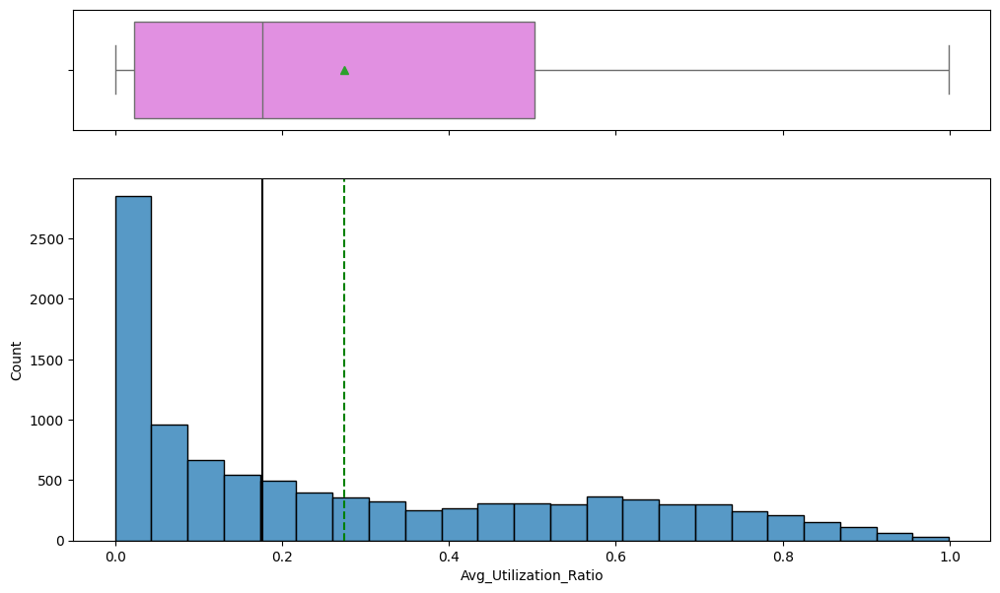

In [211]:
review(data, 'Avg_Utilization_Ratio')

* Strong right skewness, most of any of the features
* No outliers to treat

<a id=5.3></a>
## Bivariate Analysis

In [212]:
fig = px.imshow(data_int.corr(), text_auto=True, template='plotly_dark', color_continuous_scale=px.colors.sequential.Blues, aspect = 'auto', title = '<b>Correlation Matrix')
fig.update_layout(title_x=0.5)
fig.show()

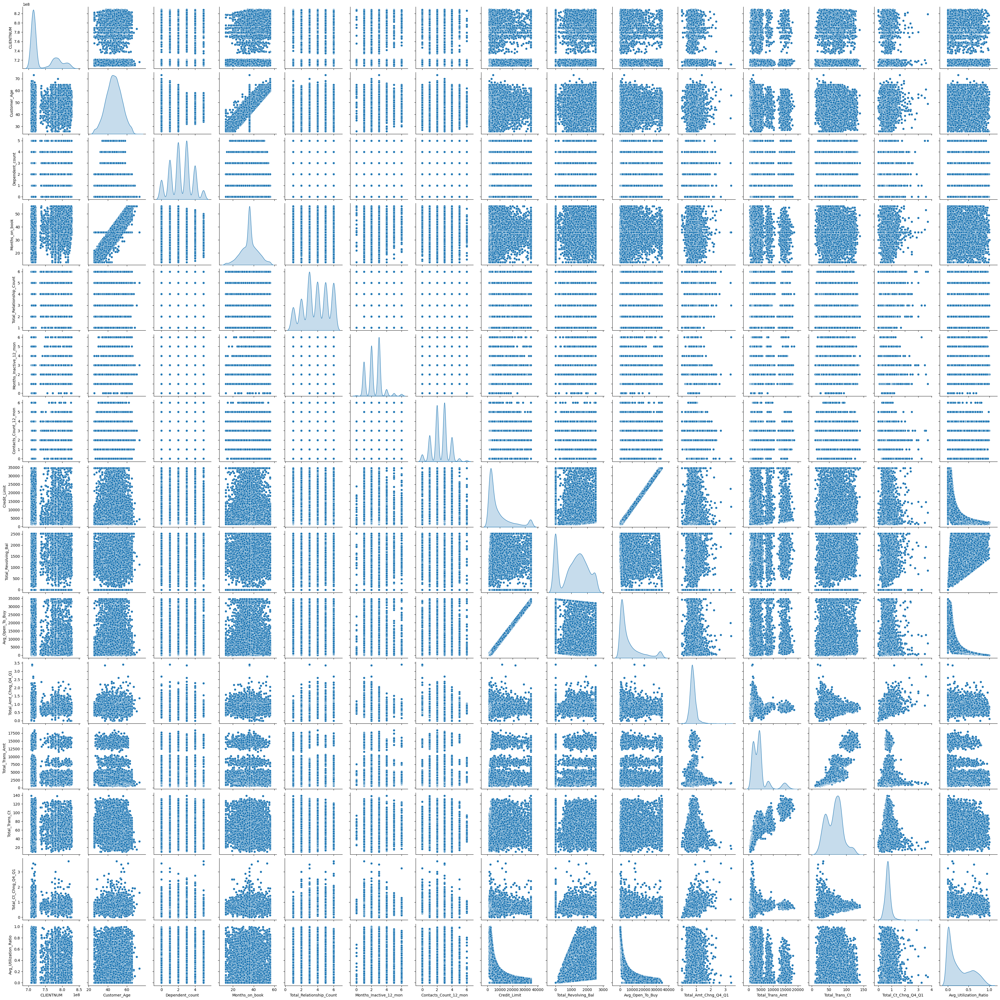

In [213]:
sns.pairplot(data_int, diag_kind='kde', kind='scatter', palette='husl')
plt.show();

**Initial Observations**
* There's a strong correlation between `Avg_Open_To_Buy` and `Credit_Limit`. If both are strongly correlated, it may not be conducive to keep both.

### `Attrition_Flag` Versus

#### `Avg_Open_To_Buy`

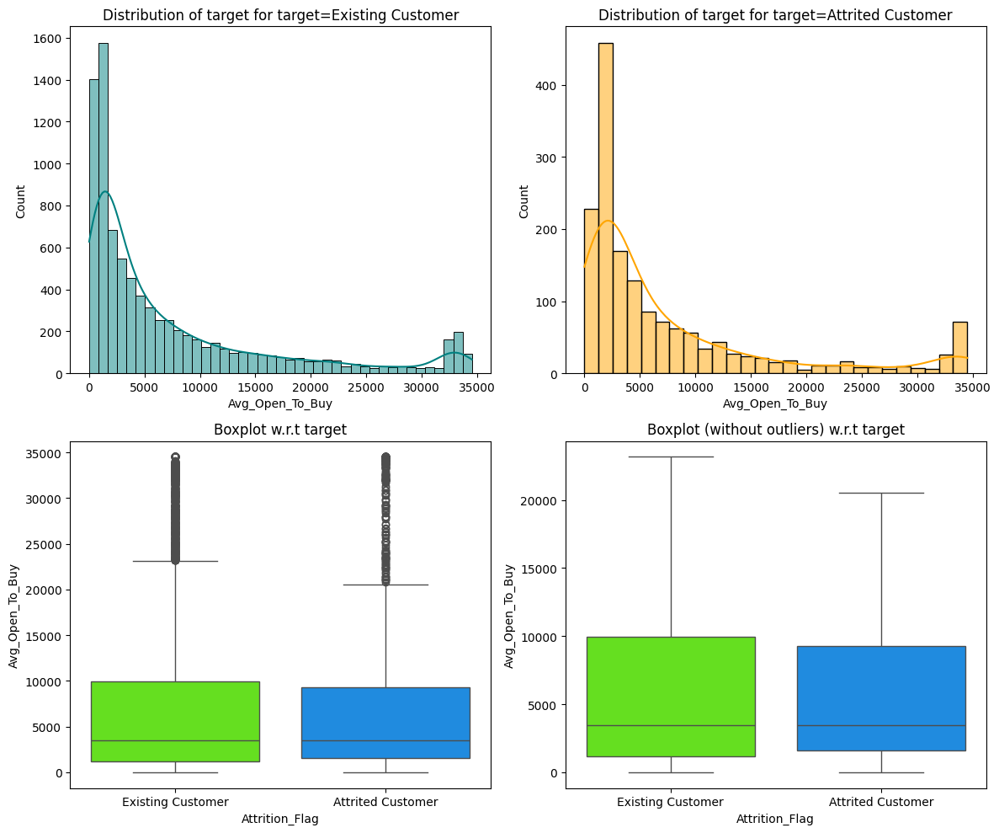

In [214]:
distribution_plot(data, 'Avg_Open_To_Buy', 'Attrition_Flag')

#### `Gender`

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------


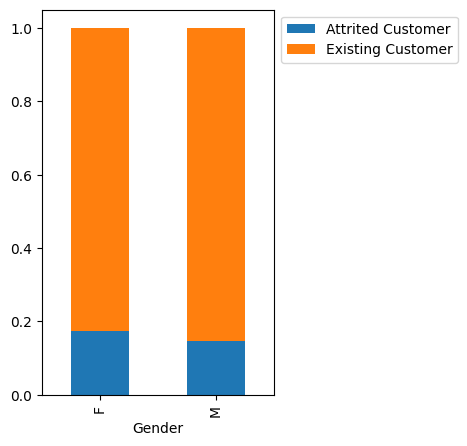

In [215]:
stacked_barplot(data, 'Gender', 'Attrition_Flag')

#### `Credit_Limit`

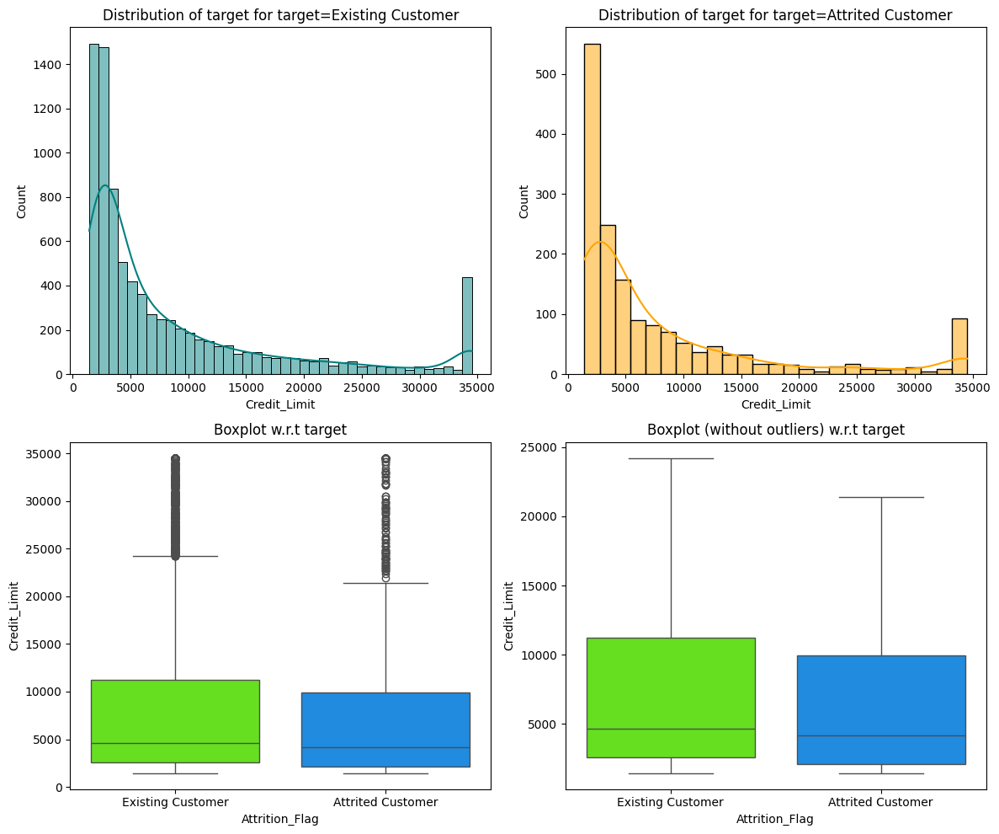

In [216]:
distribution_plot(data, 'Credit_Limit', 'Attrition_Flag')

#### `Avg_Utilization_Ratio`

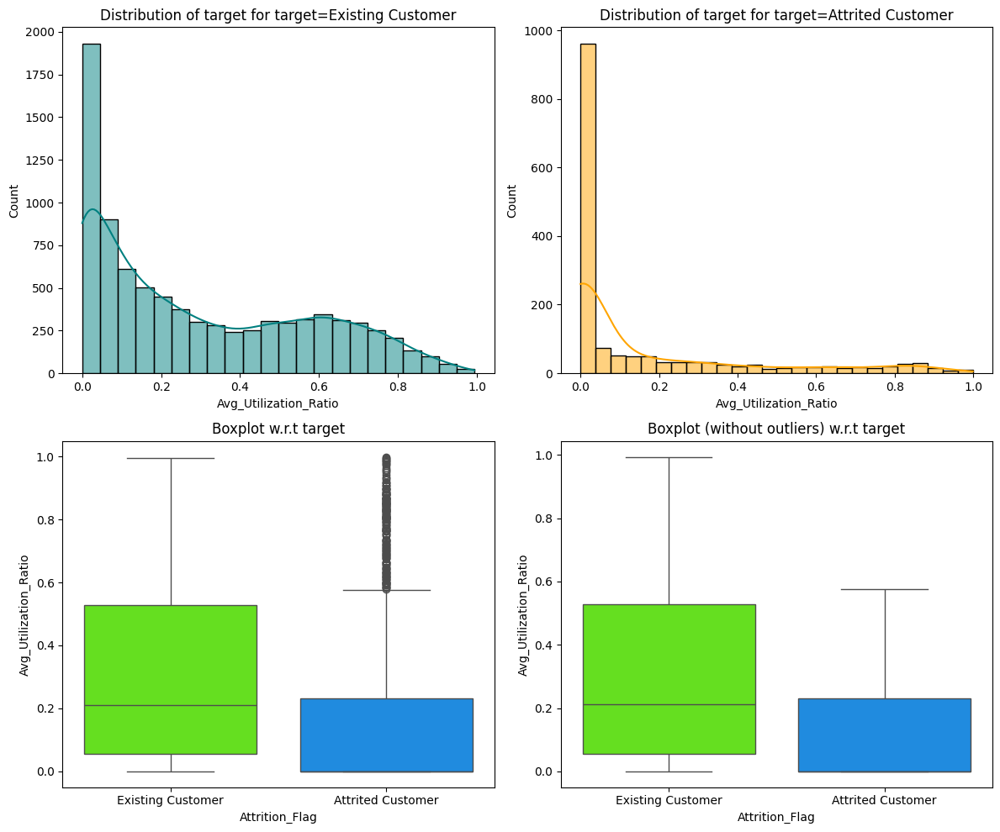

In [217]:
distribution_plot(data, 'Avg_Utilization_Ratio', 'Attrition_Flag')

#### `Contacts_Count_12_mon`

Attrition_Flag         Attrited Customer  Existing Customer    All
Contacts_Count_12_mon                                             
All                                 1627               8500  10127
3                                    681               2699   3380
2                                    403               2824   3227
4                                    315               1077   1392
1                                    108               1391   1499
5                                     59                117    176
6                                     54                  0     54
0                                      7                392    399
------------------------------------------------------------------------------------------------------------------------


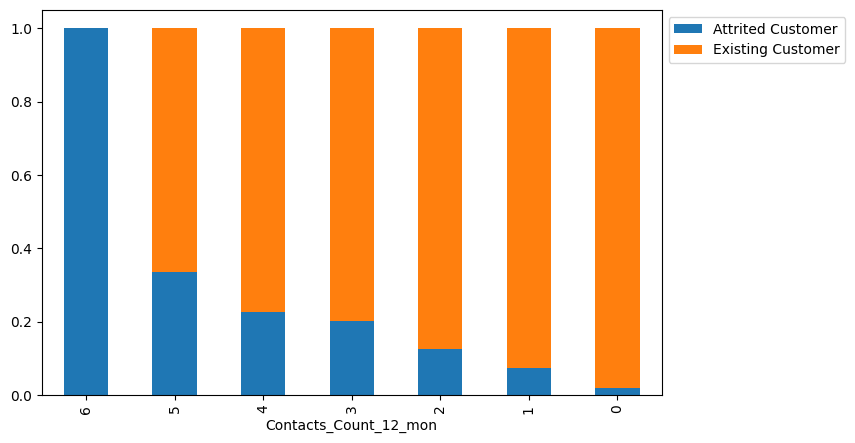

In [218]:
stacked_barplot(data, 'Contacts_Count_12_mon', 'Attrition_Flag')

* This appears to be the biggest indication of a Customer that will attrite
* The more contacts there are, the more likely they are to leave
* If there are 6 contacts, then the Customer attrites

#### `Months_on_book`

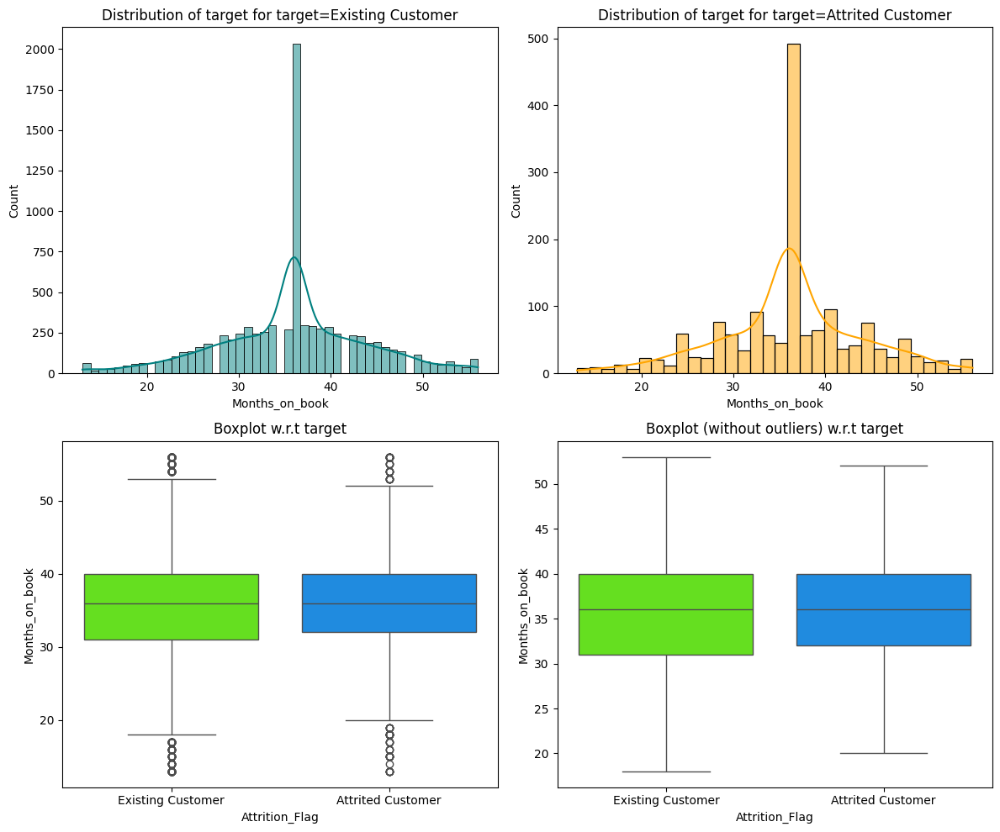

In [219]:
distribution_plot(data, 'Months_on_book', 'Attrition_Flag')

#### `Dependent_Count`

Attrition_Flag   Attrited Customer  Existing Customer    All
Dependent_count                                             
All                           1627               8500  10127
3                              482               2250   2732
2                              417               2238   2655
1                              269               1569   1838
4                              260               1314   1574
0                              135                769    904
5                               64                360    424
------------------------------------------------------------------------------------------------------------------------


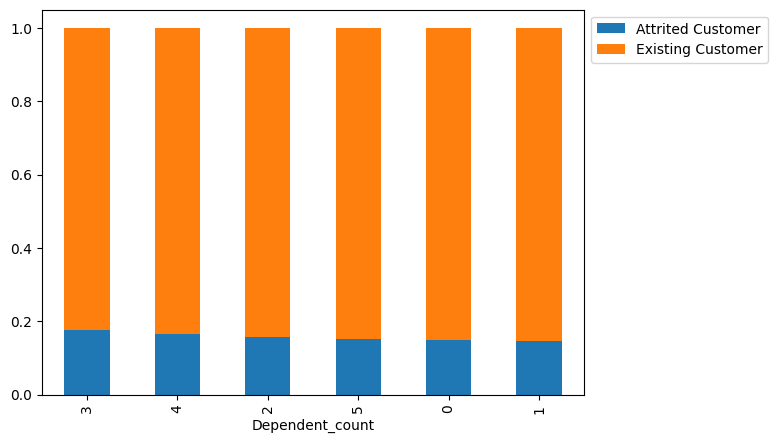

In [220]:
stacked_barplot(data, 'Dependent_count', 'Attrition_Flag')

#### `Income_Category`

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
All                           1627               8500  10127
Less than $40K                 612               2949   3561
$40K - $60K                    271               1519   1790
$80K - $120K                   242               1293   1535
$60K - $80K                    189               1213   1402
abc                            187                925   1112
$120K +                        126                601    727
------------------------------------------------------------------------------------------------------------------------


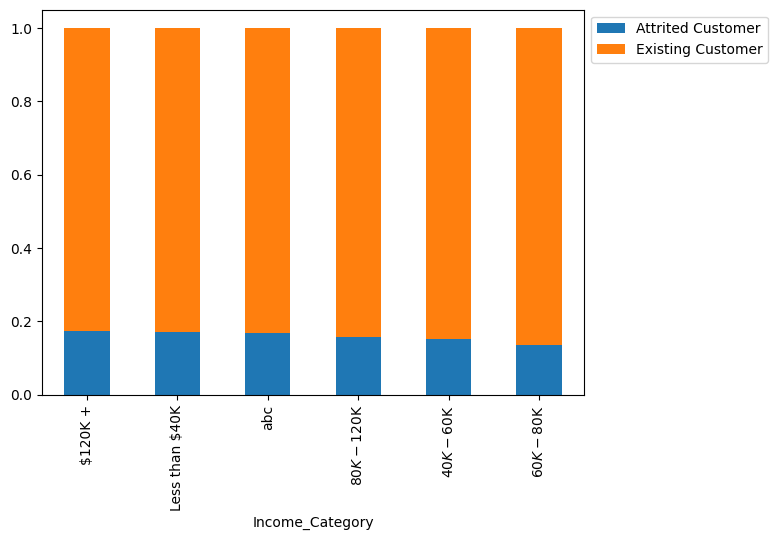

In [221]:
stacked_barplot(data, 'Income_Category', 'Attrition_Flag')

#### `Customer_Age`

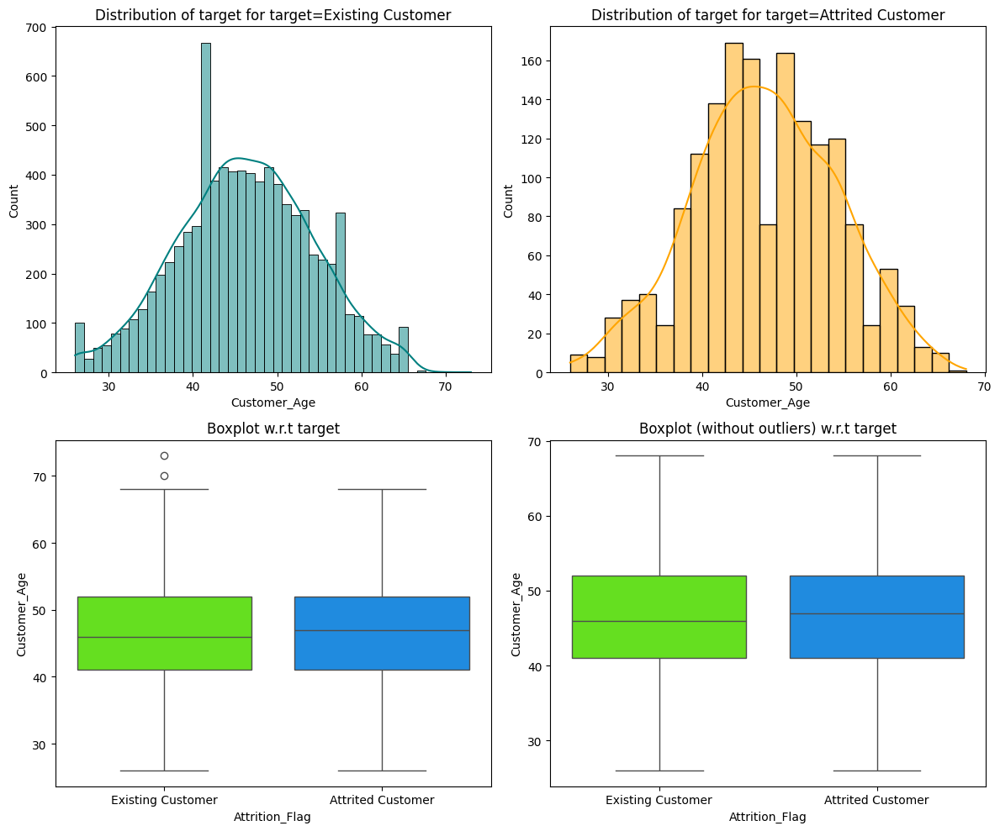

In [222]:
distribution_plot(data, 'Customer_Age', 'Attrition_Flag')

#### `Total_Ct_Chng_Q4_Q1`

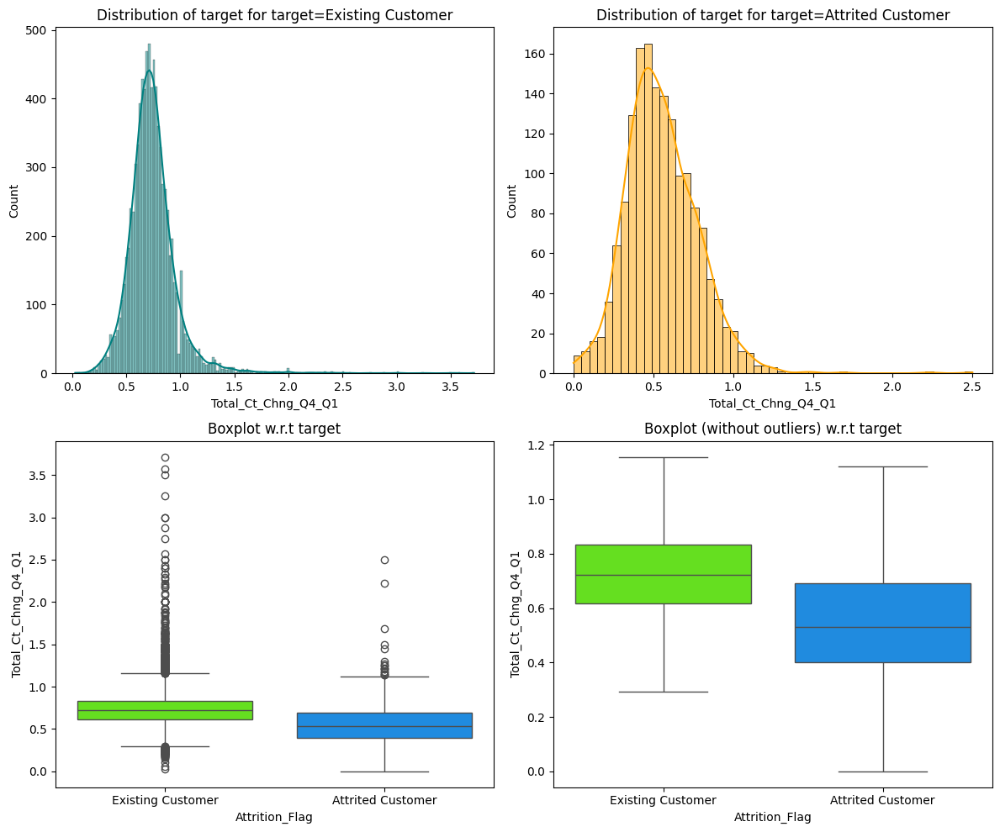

In [223]:
distribution_plot(data, 'Total_Ct_Chng_Q4_Q1', 'Attrition_Flag')

#### `Months_Inactive_12_mon`

Attrition_Flag          Attrited Customer  Existing Customer    All
Months_Inactive_12_mon                                             
All                                  1627               8500  10127
3                                     826               3020   3846
2                                     505               2777   3282
4                                     130                305    435
1                                     100               2133   2233
5                                      32                146    178
6                                      19                105    124
0                                      15                 14     29
------------------------------------------------------------------------------------------------------------------------


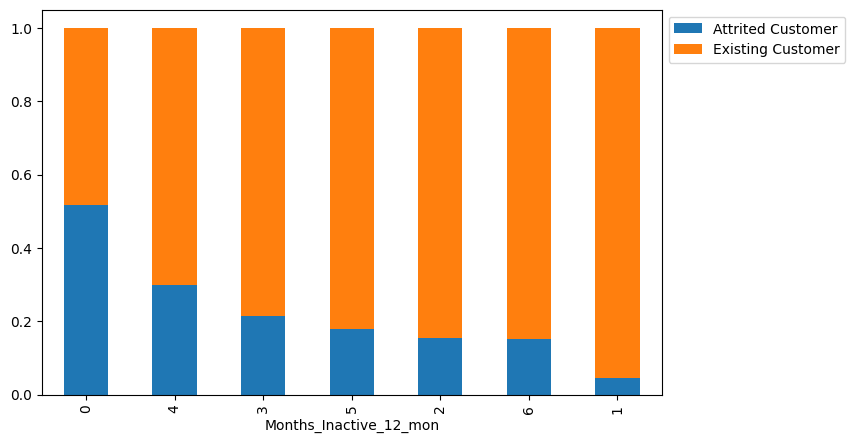

In [224]:
stacked_barplot(data, 'Months_Inactive_12_mon', 'Attrition_Flag')

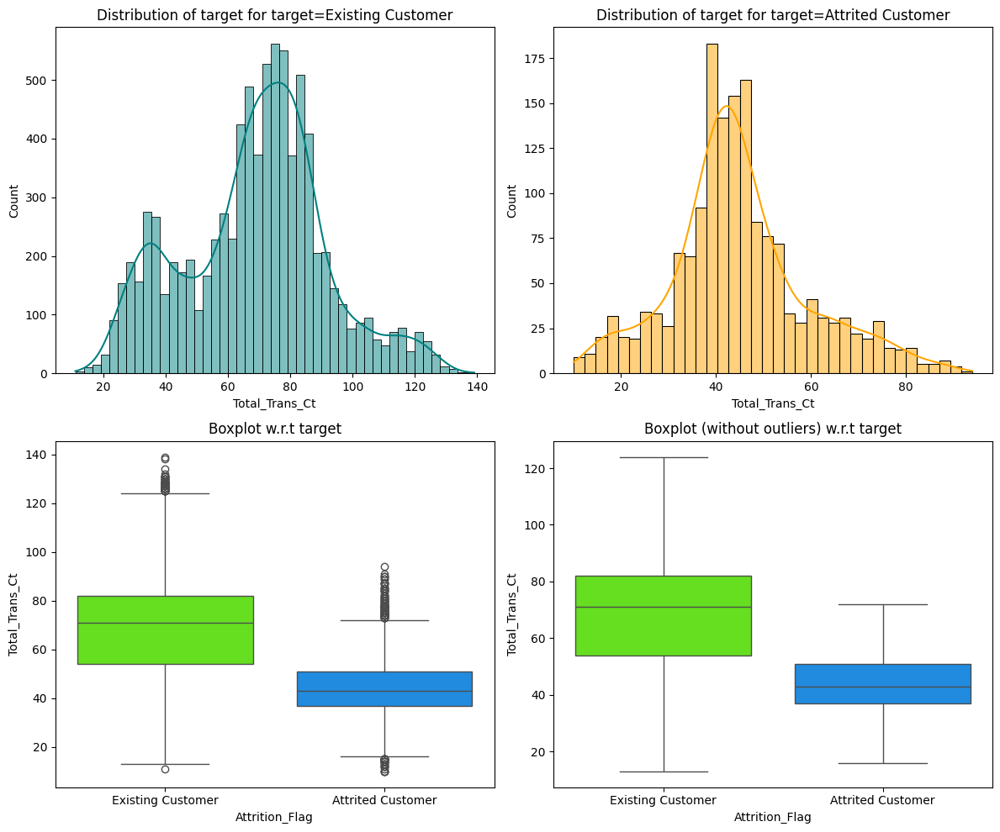

In [225]:
distribution_plot(data, 'Total_Trans_Ct', 'Attrition_Flag')

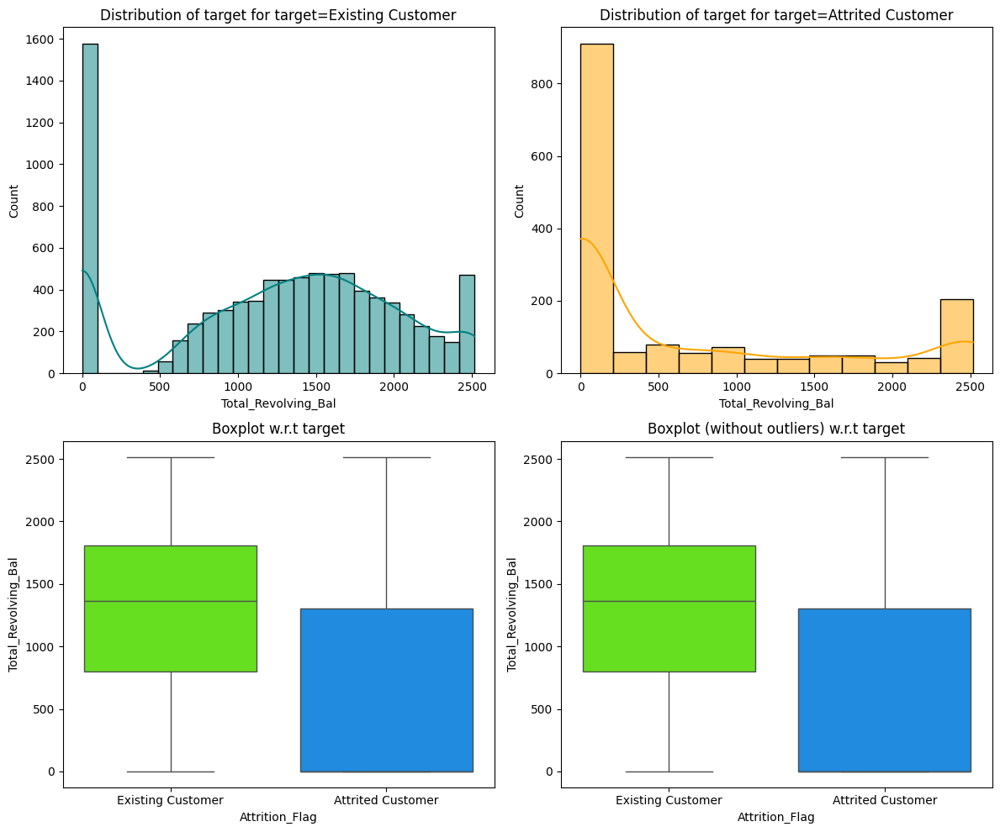

In [226]:
distribution_plot(data, 'Total_Revolving_Bal', 'Attrition_Flag')

Attrition_Flag            Attrited Customer  Existing Customer    All
Total_Relationship_Count                                             
All                                    1627               8500  10127
3                                       400               1905   2305
2                                       346                897   1243
1                                       233                677    910
5                                       227               1664   1891
4                                       225               1687   1912
6                                       196               1670   1866
------------------------------------------------------------------------------------------------------------------------


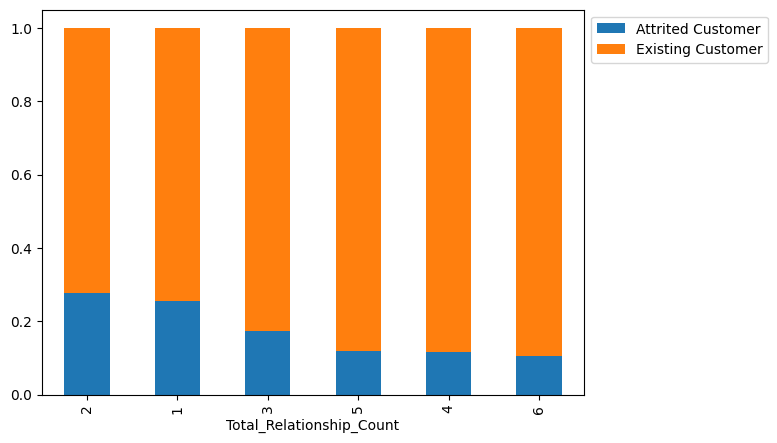

In [227]:
stacked_barplot(data, 'Total_Relationship_Count', 'Attrition_Flag')

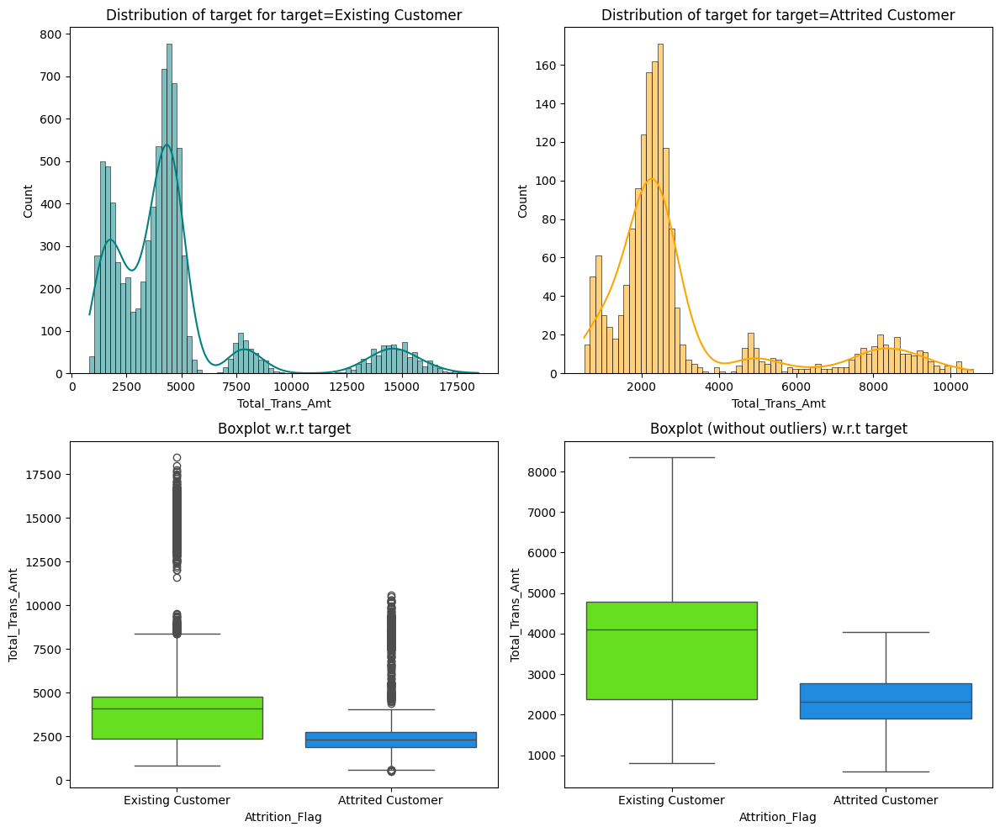

In [228]:
distribution_plot(data, 'Total_Trans_Amt', 'Attrition_Flag')

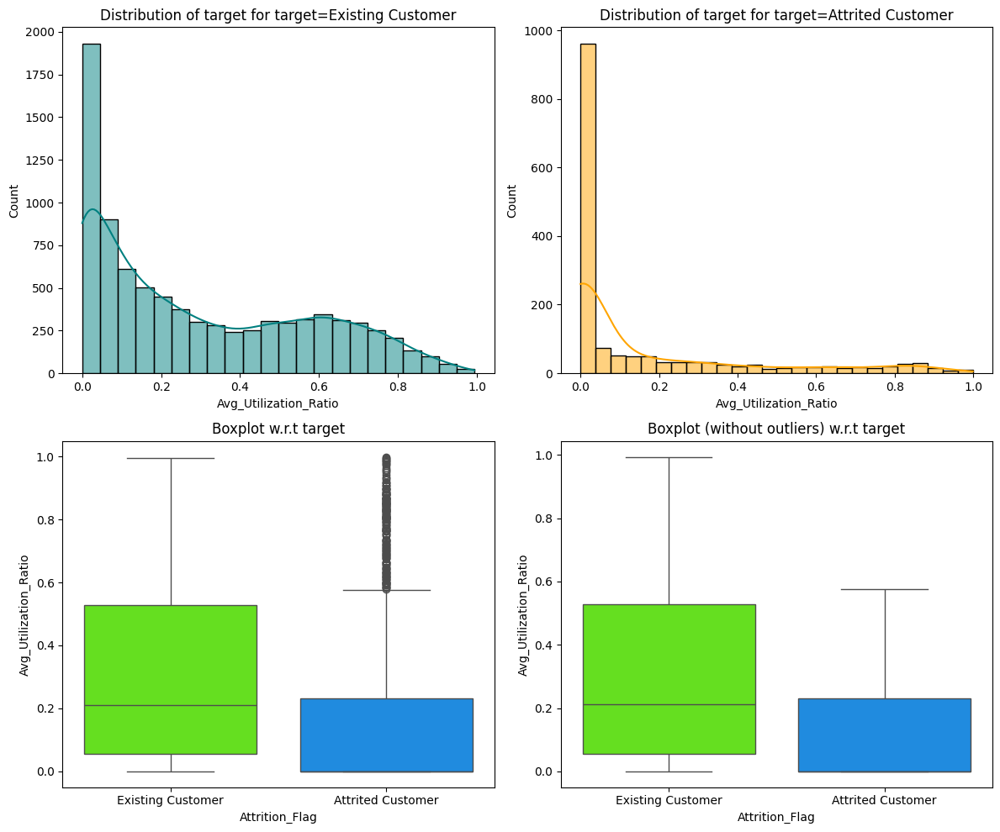

In [229]:
distribution_plot(data, 'Avg_Utilization_Ratio', 'Attrition_Flag')

### **Consolidated Observations**

* The main focus is to analyze the data with an eye on how each could potentially effect the attrition of a Customer (`Attrition_Flag`)
* The dataset contains 1,0127 rows, with 21 columns
* Overall, roughly 16% of Customers have left
* Of the 21 columns, only `Education_Level` and `Marital_Status` contain missing values
    * However, although `Income_Category` doesn't show it has missing values, it does have an `abc` value that needs to be treated
* Most of the data distributions are of either normal or right skewness
    * Normal may indicate that this will not be valuable in determining prediction of attrition
    * Right skewness shows that most Customers bias towards one end, and could help in determining attrition

**Early Indicators of Attrition**    
* Biggest revelation from the EDA was that `Contacts_Count_12_mon` showed the largest correlation from data to attrition. Customers who've had contact 6 times in the last 12 months left
*`Total_Trans_Ct`, `Total_Revolving_Bal`, `Total_Trans_Amt`, and `Avg_Utilization_Ratio` are all large indicators of potential attrition.
    * Attrited Customers have lower overall transaction count. This correlates to lower Transaction Amount as well
    * Majority of attrited Customers had a lower revolving balance, although the acceptable range was the same as existing Customers
    * Average Utilization Ratio is also lower for attrited Customers


* Two columns that won't matter for the analysis, and well be dropped are:
    * `CLIENTNUM`: As this is just a unique identifier, it won't have any impact on the models
    * `Avg_Open_to_Buy`: This is strongly correlated to `Credit_Limit`, which for the purposes of a Credit Card analysis, is more useful. Therefore we drop `Avg_Open_to_Buy`
* In comparing `Attrition_Flag` with the other columns, not much changes, if at all, in the distribution of the data

    

<a id=6></a>
## Data Pre-processing

In this section, we need to clean up the data for processing.
* Drop columns that will not be helpful to our model
* Prepare categorical columns to numbers 

#### Replace `Attrition_Flag`

In [230]:
data['Attrition_Flag'].unique()

array(['Existing Customer', 'Attrited Customer'], dtype=object)

In [231]:
data['Attrition_Flag'] = data['Attrition_Flag'].replace({'Existing Customer': 1, 'Attrited Customer': 0})

In [232]:
data

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,1,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,1,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,1,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,1,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,1,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,1,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,0,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,0,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,0,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


<a id=6.1></a>
## Missing value imputation

We need to review the three different features more in depth to understand how we can treat null values:
* `Education_Leval`
* `Marital_Status`
* `Income_Category`: Not missing, but the abc value doesn't make sense in accordance with the rest of the provided values

In [233]:
encoder = LabelEncoder()
imputer = KNNImputer(n_neighbors=10)

In [234]:
def value_imputation(data, column):
    
    # create dataframe with only the integer columns and the column with nan values that need to be addressed
    data_encoded = pd.concat([data_int, data[column]], axis = 1)
    
    # create dataframe without null values to LabelEncoder doesn't encode them. If they encode them, then KNNImputer won't address them since they are given a value
    not_null = data_encoded[column].notnull()
    data_encoded_not_null = data_encoded[not_null]
    
    # encode the column
    data_encoded_not_null[column] = encoder.fit_transform(data_encoded_not_null[column])
    
    # create data frame with the null values so we can join them back into the dataframe
    null_rows = data_encoded[column].isnull()
    data_encoded_null= data_encoded[null_rows]
    
    # joine them and sort back by their index
    data_encoded = pd.concat([data_encoded_not_null, data_encoded_null])
    data_encoded = data_encoded.sort_index()

    # impute values using KNNImputer, set to 10 nearest neighbors. Using as much of the data from other columns as possible
    data_impute = imputer.fit_transform(data_encoded)
    data_impute = pd.DataFrame(data_impute, columns=data_encoded.columns)

    # Using CLIENTNUM to insert new values back into original dataframe
    data.set_index('CLIENTNUM', inplace=True)
    data_impute.set_index('CLIENTNUM', inplace=True)
    data[column] = data_impute[column]
    data.reset_index(inplace=True)
    data_impute.reset_index(inplace=True)
    
    # rounding values outputted by KNNImputer so we can transform the values back to their original string values
    data[column] = data[column].round().astype(int)
    data[column] = encoder.inverse_transform(data[column])


#### `Education_Level`

In [235]:
value_imputation(data, 'Education_Level')

In [236]:
data['Education_Level'].unique()

array(['High School', 'Graduate', 'Uneducated', 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

* First thought was to see if there were any correlations between the data points of each of the other values in `Education_Level` and the Nan values and draw a conclusion as to what the correct missing value should be. Inconclusive
* Since this could not be determined, I found that SimpleImputer would not be the right method to use
* Therefore, I decided to utilize KNNImputer to analyse the correct, or at least closest, values to impute based on 10 nearest neighbors
* LabelEncoder would not work, perhaps a skill issue, so I manually adjusted values to integer, and then back to string values

#### `Marital_Status`

Choosing to use the same KNNImputer methodology for `Marital_Status`

In [237]:
value_imputation(data, 'Marital_Status')

In [238]:
data['Marital_Status'].unique()

array(['Married', 'Single', 'Divorced'], dtype=object)

#### `Income_Category`

In [239]:
data['Income_Category'] = data['Income_Category'].replace({'abc': np.nan})

In [240]:
data['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', nan], dtype=object)

In [241]:
value_imputation(data, 'Income_Category')

In [242]:
data['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +'], dtype=object)

In [243]:
data.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

* Upon analysis of other categories, could not find another way to impute the appropriate values to 'abc.' Therefore, I treated it as a nan value, and utilized my `value_imputation` function 

<a id=6.2></a>
#### Dropping Columns

* `CLIENTNUM`: Dropping since it only contains unique columns
* `Avg_Open_To_Buy`: Nearly directly correlated with `Credit_Limit` (99%). We don't need to keep both.

In [244]:
data.drop(['CLIENTNUM', 'Avg_Open_To_Buy'], axis = 1, inplace = True)

<a id=6.3></a>
### Treating Outliers

* Prior to treating outliers, we're going to assess the performance of the models as is.

<a id=7></a>
## Model Building

### Model evaluation criterion

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

### Prep Categorical Columns

In [245]:
data_cat = data.select_dtypes(exclude='number').columns.tolist()

In [246]:
data=pd.get_dummies(data, columns=data_cat)
data.head()

,Attrition_Flag,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,1,45,3,39,5,1,3,12691.0,777,1.335,...,False,False,False,True,False,False,True,False,False,False
1,1,49,5,44,6,1,2,8256.0,864,1.541,...,True,False,False,False,False,True,True,False,False,False
2,1,51,3,36,4,1,0,3418.0,0,2.594,...,False,False,False,False,True,False,True,False,False,False
3,1,40,4,34,3,4,1,3313.0,2517,1.405,...,True,False,False,False,False,True,True,False,False,False
4,1,40,3,21,5,1,0,4716.0,0,2.175,...,False,False,False,True,False,False,True,False,False,False


### Split Data into Train and Test Sets

In [247]:
X = data.drop('Attrition_Flag', axis = 1)
y = data.pop('Attrition_Flag')

In [248]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=1,stratify=y)

<a id=7.1></a>
### Model Building with original data

Sample code for model building with original data

In [249]:
def confusion_matrix_sklearn(title, model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="", cmap='Blues')
    plt.title(title)
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [250]:
results = pd.DataFrame(columns=["Model", "Training Performance (Original)", "Training Performance (Over)", "Training Performance (Under)", "Testing Performance (Original)", "Testing Performance (Over)", "Testing Performance (Under)"])


Training Performance:

Bagging: 0.9976466633047572
RandomForest: 1.0
AdaBoost: 0.9813414019162885
XGBoost: 1.0
Stacking: 0.998150949739452

Validation Performance:

Bagging: 0.9753038024304195
RandomForest: 0.9890239121912975
AdaBoost: 0.981967855742846
XGBoost: 0.9870638965111721
Stacking: 0.9835358682869463


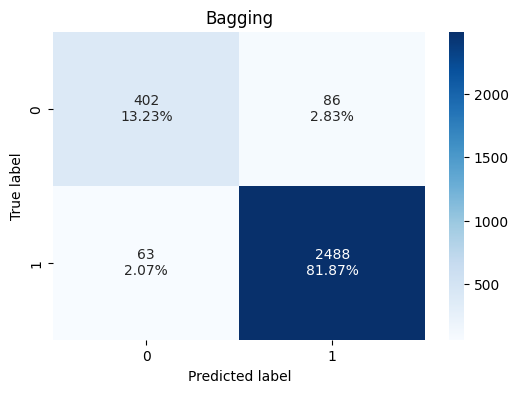

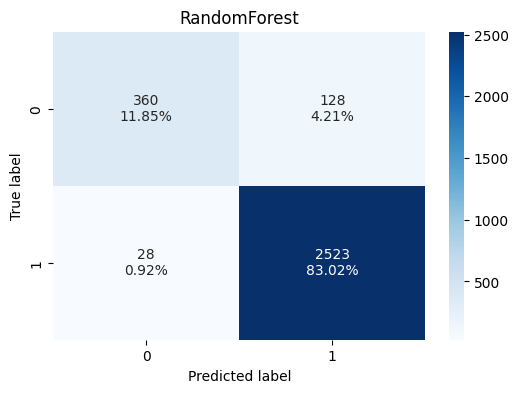

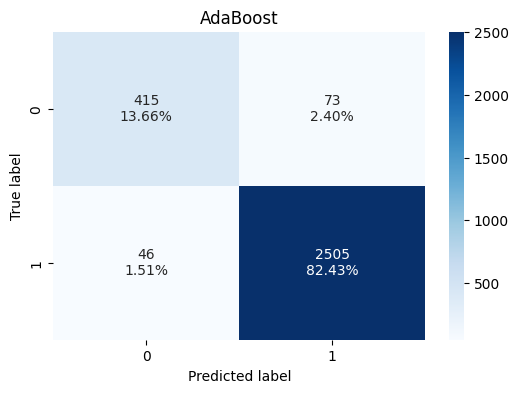

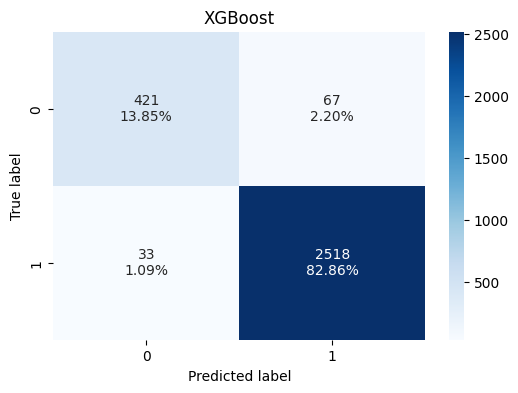

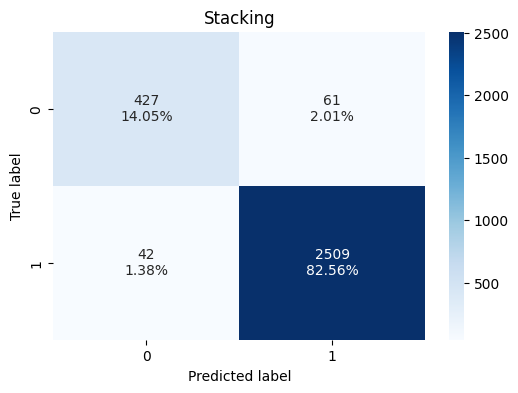

In [251]:
models = []  # Empty list to store all the models

bagging_model = ("Bagging", BaggingClassifier(random_state=1))
random_forest_model = ("RandomForest", RandomForestClassifier(random_state=1))
adaboost_model = ("AdaBoost", AdaBoostClassifier(random_state=1))
xgboost_model = ("XGBoost", XGBClassifier(random_state=1))

# Appending models into the list
models.append(bagging_model)
models.append(random_forest_model)
models.append(adaboost_model)
models.append(xgboost_model)

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    training = pd.DataFrame([(name, scores)], columns=['Model', 'Training Performance (Original)'])
    results = pd.concat([results, training], ignore_index = True)
    print("{}: {}".format(name, scores))

stacking_model = StackingClassifier(estimators=[bagging_model, xgboost_model, adaboost_model], final_estimator=random_forest_model[1])
stacking_model.fit(X_train, y_train)
stacking_score = recall_score(y_train, stacking_model.predict(X_train))
training = pd.DataFrame([("Stacking", stacking_score)], columns=['Model', 'Training Performance (Original)'])
results = pd.concat([results, training], ignore_index = True)
print("Stacking: {}".format(stacking_score))


print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_test, model.predict(X_test))
    results.loc[results['Model'] == name, 'Testing Performance (Original)'] = scores_val
    print("{}: {}".format(name, scores_val))

stacking_val = recall_score(y_test, stacking_model.predict(X_test))
results.loc[results['Model'] == 'Stacking', 'Testing Performance (Original)'] = stacking_val
print("Stacking: {}".format(stacking_val))
    
for name, model in models:
    confusion_matrix_sklearn(name, model, X_test, y_test)

confusion_matrix_sklearn("Stacking", stacking_model, X_test, y_test)


* `RandomForest` had the least amount of false negatives, with `XGBoost` coming in second. 
* `Stacking` surprisingly had the third highest, even though it leverages that of the rest of the models.
    * Initially, Stacking was using `XGBoost` as the final estimator, but after assessing performance, this was changed to `RandomForest` wich reduced the False Negatives by 10.

<a id=7.2></a>
### Model Building with Oversampled data


In [252]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


Training Performance:

Bagging: 0.9961338040006724
RandomForest: 1.0
AdaBoost: 0.958480416876786
XGBoost: 1.0
Stacking: 0.9966380904353673

Validation Performance:

Bagging: 0.9588396707173658
RandomForest: 0.9741277930223442
AdaBoost: 0.9541356330850647
XGBoost: 0.9847118776950216
Stacking: 0.973343786750294


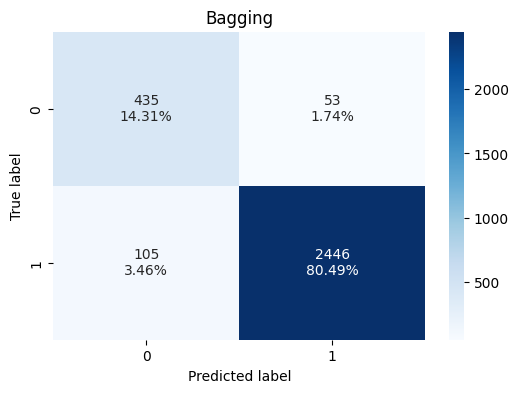

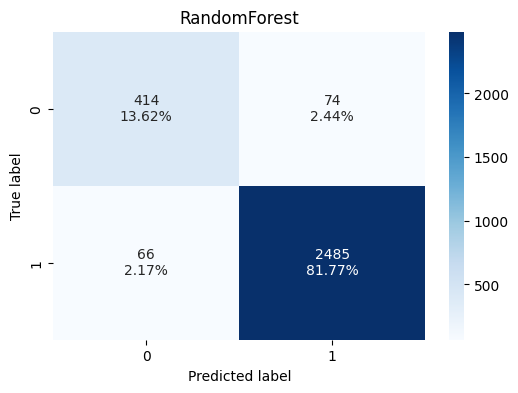

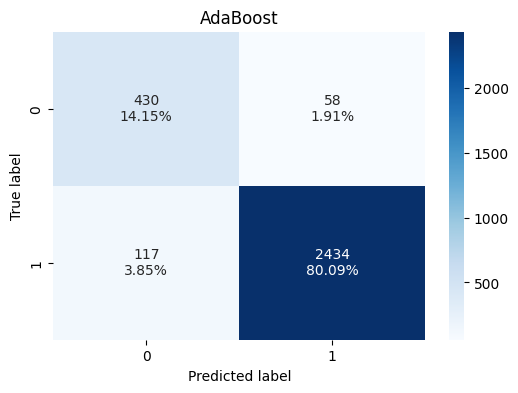

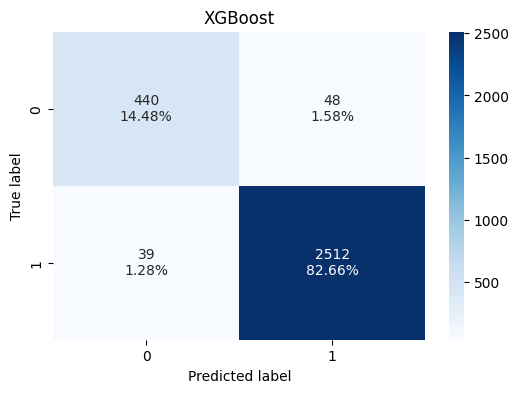

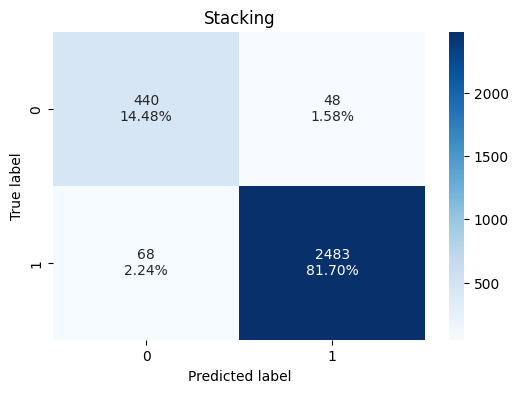

In [253]:
models_over = []  # Empty list to store all the models_over

bagging_model = ("Bagging", BaggingClassifier(random_state=1))
random_forest_model = ("RandomForest", RandomForestClassifier(random_state=1))
adaboost_model = ("AdaBoost", AdaBoostClassifier(random_state=1))
xgboost_model = ("XGBoost", XGBClassifier(random_state=1))

# Appending models_over into the list
models_over.append(bagging_model)
models_over.append(random_forest_model)
models_over.append(adaboost_model)
models_over.append(xgboost_model)

print("\n" "Training Performance:" "\n")
for name, model in models_over:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    results.loc[results['Model'] == name, 'Training Performance (Over)'] = scores
    print("{}: {}".format(name, scores))
    
    

stacking_model = StackingClassifier(estimators=[bagging_model, xgboost_model, adaboost_model], final_estimator=random_forest_model[1])
stacking_model.fit(X_train_over, y_train_over)
stacking_score = recall_score(y_train_over, stacking_model.predict(X_train_over))
results.loc[results['Model'] == 'Stacking', 'Training Performance (Over)'] = stacking_score
print("Stacking: {}".format(stacking_score))

print("\n" "Validation Performance:" "\n")

for name, model in models_over:
    model.fit(X_train_over, y_train_over)
    scores_val = recall_score(y_test, model.predict(X_test))
    results.loc[results['Model'] == name, 'Testing Performance (Over)'] = scores_val
    print("{}: {}".format(name, scores_val))

stacking_val = recall_score(y_test, stacking_model.predict(X_test))
results.loc[results['Model'] == 'Stacking', 'Testing Performance (Over)'] = stacking_val
print("Stacking: {}".format(stacking_val))
    
for name, model in models_over:
    confusion_matrix_sklearn(name, model, X_test, y_test)

confusion_matrix_sklearn("Stacking", stacking_model, X_test, y_test)

<a id=7.3></a>
### Model Building with Undersampled data

In [254]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)


Training Performance:

Bagging: 0.9938542581211589
RandomForest: 1.0
AdaBoost: 0.9438103599648815
XGBoost: 1.0
Stacking: 0.9982440737489026

Validation Performance:

Bagging: 0.915327322618581
RandomForest: 0.9255194041552333
AdaBoost: 0.9239513916111329
XGBoost: 0.9502156017248138
Stacking: 0.9447275578204626


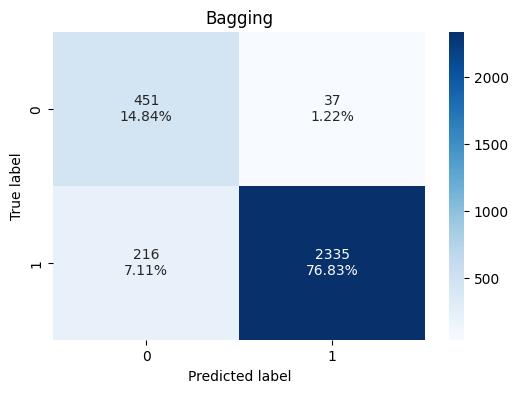

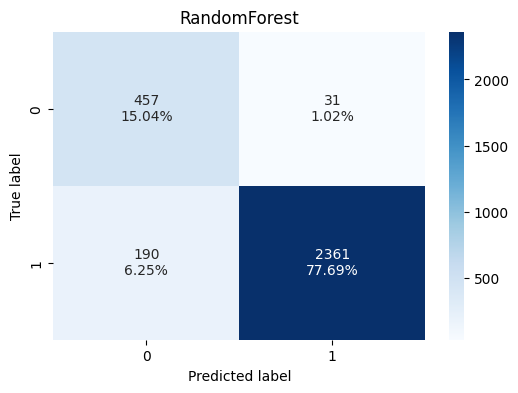

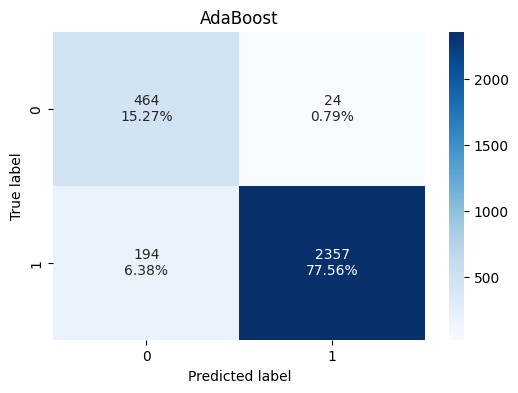

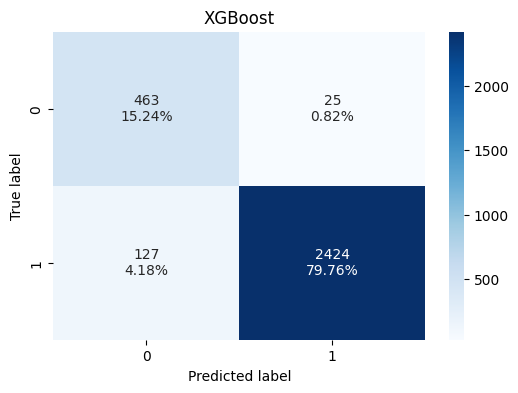

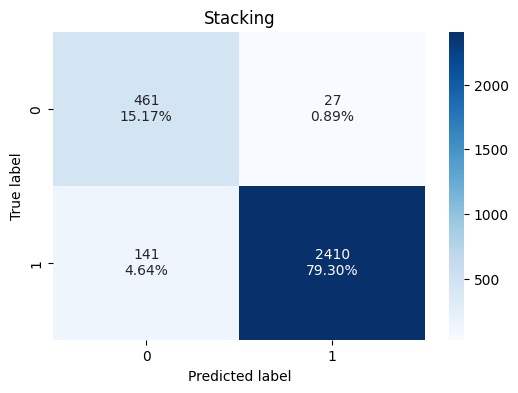

In [255]:
models_under = []  # Empty list to store all the models_under

bagging_model = ("Bagging", BaggingClassifier(random_state=1))
random_forest_model = ("RandomForest", RandomForestClassifier(random_state=1))
adaboost_model = ("AdaBoost", AdaBoostClassifier(random_state=1))
xgboost_model = ("XGBoost", XGBClassifier(random_state=1))

# Appending models_under into the list
models_under.append(bagging_model)
models_under.append(random_forest_model)
models_under.append(adaboost_model)
models_under.append(xgboost_model)

print("\n" "Training Performance:" "\n")
for name, model in models_under:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    results.loc[results['Model'] == name, 'Training Performance (Under)'] = scores
    print("{}: {}".format(name, scores))

stacking_model = StackingClassifier(estimators=[bagging_model, xgboost_model, adaboost_model], final_estimator=random_forest_model[1])
stacking_model.fit(X_train_un, y_train_un)
stacking_score = recall_score(y_train_un, stacking_model.predict(X_train_un))
results.loc[results['Model'] == 'Stacking', 'Training Performance (Under)'] = stacking_score
print("Stacking: {}".format(stacking_score))

print("\n" "Validation Performance:" "\n")

for name, model in models_under:
    model.fit(X_train_un, y_train_un)
    scores_val = recall_score(y_test, model.predict(X_test))
    results.loc[results['Model'] == name, 'Testing Performance (Under)'] = scores_val
    print("{}: {}".format(name, scores_val))

stacking_val = recall_score(y_test, stacking_model.predict(X_test))
results.loc[results['Model'] == 'Stacking', 'Testing Performance (Under)'] = stacking_val
print("Stacking: {}".format(stacking_val))
    
for name, model in models_under:
    confusion_matrix_sklearn(name, model, X_test, y_test)

confusion_matrix_sklearn("Stacking", stacking_model, X_test, y_test)

In [256]:
results.T

,0,1,2,3,4
Model,Bagging,RandomForest,AdaBoost,XGBoost,Stacking
Training Performance (Original),0.997647,1.0,0.981341,1.0,0.998151
Training Performance (Over),0.996134,1.0,0.95848,1.0,0.996638
Training Performance (Under),0.993854,1.0,0.94381,1.0,0.998244
Testing Performance (Original),0.975304,0.989024,0.981968,0.987064,0.983536
Testing Performance (Over),0.95884,0.974128,0.954136,0.984712,0.973344
Testing Performance (Under),0.915327,0.925519,0.923951,0.950216,0.944728


In [257]:
fig = go.Figure()

for col in results.columns[1:]:
    fig.add_trace(go.Scatter(x=results['Model'], y=results[col], mode='lines+markers', name=col))

fig.update_layout(title='Performance for Each Model',
                   xaxis_title='Model',
                   yaxis_title='Performance')


fig.show()

* Recall scores were the best on the `Original` datasets, with `RandomForest` performing the best
* `AdaBoost` had the closest fit between training and testing sets for the Original data showing neither overfitting or underfitting of the data. This could be a good indication that it's handling the dataset well, and could increase performance after tuning.
* Undersampling the data was by far the worst amongst all models
* The recall scores performances were surprising, as none of the data was either scaled nor had their outliers treated.
* It also appears that KNNImputer was a great way to impute the nan values (or 'abc' values)
* For the three models will be using, we'll base it off of their training and testing performance (`model`: reasoning):
    * `RandomForest`: highest recall score on both the training and testing of the Original data set
    * `Adaboost`: had closest recalls core between test and training, indicating that it's fitting the data well between the two.
    * `XGBoost`: was second in the recall score performance of the original data set, and it's also a popular choice due to it's robustness and complexity. Overall, studies have shown XGBoost, after proper hyperparameter tuning, to be a dependable model.
    * `Stacking` (Bonus): After tuning, it will be interesting to see how this model's performance may be increased (or decreased).

<a id=8></a>
### Hyperparameter Tuning

#### Create definitions for recall scorer and showing scores

In [258]:
# create recall score function
def recall (y_true, y_pred):
    return recall_score(y_true, y_pred)


In [259]:
# Evaluation Function
def show_scores(model):
    train_preds = model.predict(X_train)
    val_preds = model.predict(X_test)
    scores = {"Training Recall": recall(y_train, train_preds),
              "Testing Recall": recall(y_test, val_preds),
              "Training Precision": precision_score(y_train, train_preds),
              "Testing Precision": precision_score(y_test, val_preds),
              "Training F1 Score": f1_score(y_train, train_preds),
              "Testing F1 Score": f1_score(y_test, val_preds),}
    return scores

#### `RandomForest` Tuning

In [297]:
# RandomForest Tuning
rf_grid = {"n_estimators": np.arange(100, 1200, 50),
           "max_depth": [None, 5, 10, 15, 20, 30],
           "min_samples_split": np.arange(2, 20, 2),
           "min_samples_leaf": np.arange(1, 20, 2),
           "max_features": [0.5, 1, "sqrt", "auto", None, 'log2'],
           "bootstrap": [True]}

# Instantiate RandomizedSearchCV model
rf_model = RandomizedSearchCV(RandomForestClassifier(n_jobs=-1,
                                                    random_state=42),
                              param_distributions=rf_grid,
                              n_iter=50,
                              cv=5,
                              verbose=2,
                              scoring='f1')

# Fit the RandomizedSearchCV model
rf_model.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END bootstrap=True, max_depth=15, max_features=0.5, min_samples_leaf=9, min_samples_split=10, n_estimators=950; total time=   2.3s
[CV] END bootstrap=True, max_depth=15, max_features=0.5, min_samples_leaf=9, min_samples_split=10, n_estimators=950; total time=   2.2s


[CV] END bootstrap=True, max_depth=15, max_features=0.5, min_samples_leaf=9, min_samples_split=10, n_estimators=950; total time=   2.3s
[CV] END bootstrap=True, max_depth=15, max_features=0.5, min_samples_leaf=9, min_samples_split=10, n_estimators=950; total time=   2.2s
[CV] END bootstrap=True, max_depth=15, max_features=0.5, min_samples_leaf=9, min_samples_split=10, n_estimators=950; total time=   3.1s
[CV] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=19, min_samples_split=4, n_estimators=850; total time=   1.2s
[CV] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=19, min_samples_split=4, n_estimators=850; total time=   1.3s
[CV] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=19, min_samples_split=4, n_estimators=850; total time=   2.0s
[CV] END bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=19, min_samples_split=4, n_estimators=850; total time=   1.7s
[CV] END bootstrap=True, max_depth=5, max_featur

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=50,
                   param_distributions={'bootstrap': [True],
                                        'max_depth': [None, 5, 10, 15, 20, 30],
                                        'max_features': [0.5, 1, 'sqrt', 'auto',
                                                         None, 'log2'],
                                        'min_samples_leaf': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19]),
                                        'min_samples_split': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18]),
                                        'n_estimators': array([ 100,  150,  200,  250,  300,  350,  400,  450,  500,  550,  600,
        650,  700,  750,  800,  850,  900,  950, 1000, 1050, 1100, 1150])},
                   scoring='f1', verbose=2)

In [298]:
show_scores(rf_model)

{'Training Recall': 0.9956295175659775,
 'Testing Recall': 0.9854958839670718,
 'Training Precision': 0.989640768588137,
 'Testing Precision': 0.9669230769230769,
 'Training F1 Score': 0.992626110273169,
 'Testing F1 Score': 0.9761211415259173}

In [299]:
rf_model_scores = show_scores(rf_model)
rf_model_scores = list(('Tuned Random Forest', *rf_model_scores.values()))
comp_df = pd.DataFrame([rf_model_scores], columns=['Model', 'Training Recall', 'Testing Recall', 'Training Precision', 'Testing Precision', 'Training F1 Score', 'Testing F1 Score'], index=['Random Forest'])

In [300]:
best_regression = rf_model.best_estimator_
best_regression

RandomForestClassifier(max_features=0.5, min_samples_split=16, n_estimators=550,
                       n_jobs=-1, random_state=42)

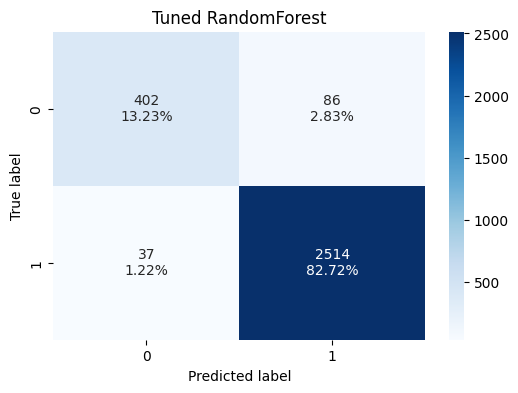

In [301]:
confusion_matrix_sklearn("Tuned RandomForest", rf_model, X_test, y_test)

**Best Model**

RandomForestClassifier(max_depth=5, max_features=1, min_samples_leaf=11,
                       min_samples_split=10, n_estimators=450, n_jobs=-1,
                       random_state=42)

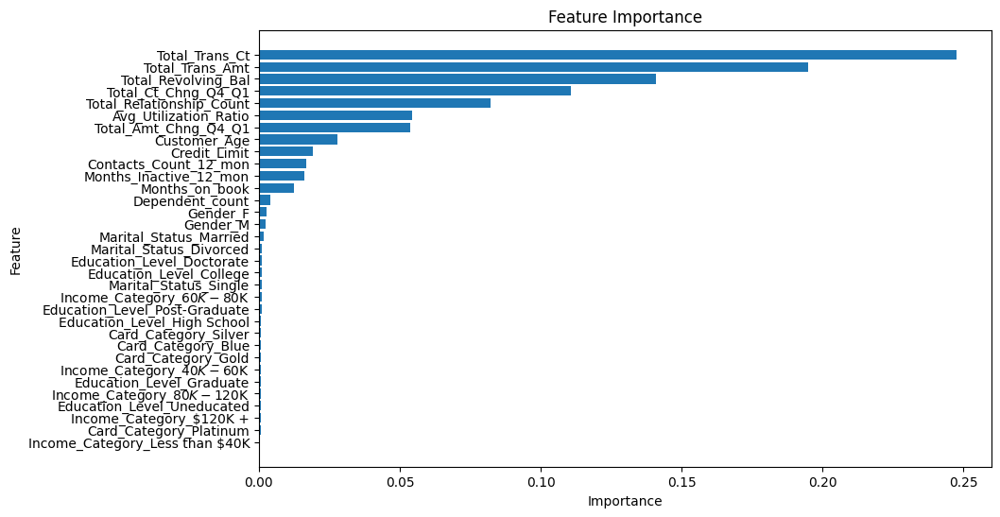

In [302]:
best_regression.fit(X, y)

# Get feature importances
importances = best_regression.feature_importances_

# Create a DataFrame with feature names and importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importances = feature_importances.sort_values('Importance', ascending=True)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()


#### `AdaBoost` Tuning

In [303]:
# RandomForest Tuning
ad_grid = {"n_estimators": randint(50, 500),
           "learning_rate": [0.01, 0.05, 0.1, 0.3, 1],
           "algorithm": ['SAMME', 'SAMME.R'],
           }

# Instantiate RandomizedSearchCV model
ad_model = RandomizedSearchCV(AdaBoostClassifier(random_state=42),
                              param_distributions=ad_grid,
                              n_iter=50,
                              cv=5,
                              verbose=2,
                              scoring='f1')

# Fit the RandomizedSearchCV model
ad_model.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END algorithm=SAMME.R, learning_rate=0.01, n_estimators=50; total time=   0.3s
[CV] END algorithm=SAMME.R, learning_rate=0.01, n_estimators=50; total time=   0.3s
[CV] END algorithm=SAMME.R, learning_rate=0.01, n_estimators=50; total time=   0.3s
[CV] END algorithm=SAMME.R, learning_rate=0.01, n_estimators=50; total time=   0.3s


[CV] END algorithm=SAMME.R, learning_rate=0.01, n_estimators=50; total time=   0.3s
[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=309; total time=   1.5s
[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=309; total time=   1.4s
[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=309; total time=   1.3s
[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=309; total time=   1.3s
[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=309; total time=   1.4s
[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=146; total time=   0.6s
[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=146; total time=   0.7s
[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=146; total time=   0.8s
[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=146; total time=   0.7s
[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=146; total time=   0.7s
[CV] END algorithm=SAMME.R, learning_rate=0.05, n_estimators=285; total time=   1.3s
[CV] END al

RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(random_state=42),
                   n_iter=50,
                   param_distributions={'algorithm': ['SAMME', 'SAMME.R'],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.3,
                                                          1],
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x29b7cc0e0>},
                   scoring='f1', verbose=2)

In [304]:
show_scores(ad_model)

{'Training Recall': 0.985711884350311,
 'Testing Recall': 0.9854958839670718,
 'Training Precision': 0.9774962493748958,
 'Testing Precision': 0.9729102167182663,
 'Training F1 Score': 0.9815868764646802,
 'Testing F1 Score': 0.9791626095423563}

In [305]:
ad_model_scores = show_scores(ad_model)
ad_model_scores = list(('Tuned AdaBoost', *ad_model_scores.values()))
comp_ad = pd.DataFrame([ad_model_scores], columns=['Model', 'Training Recall', 'Testing Recall', 'Training Precision', 'Testing Precision', 'Training F1 Score', 'Testing F1 Score'], index=['Random Forest'])
comp_df = pd.concat([comp_df, comp_ad], ignore_index=True)

In [306]:
best_adaboost = ad_model.best_estimator_
best_adaboost

AdaBoostClassifier(learning_rate=0.3, n_estimators=421, random_state=42)

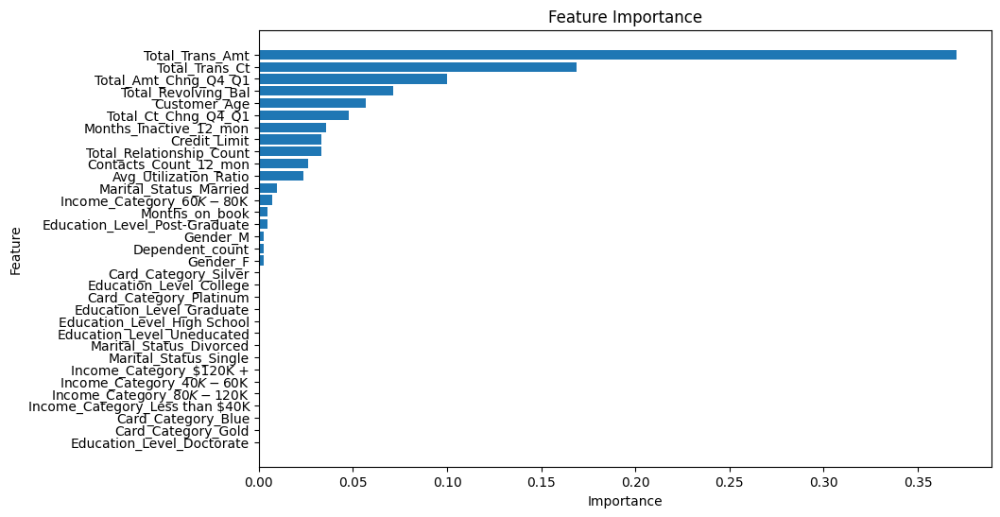

In [307]:
best_adaboost.fit(X, y)

# Get feature importances
importances = best_adaboost.feature_importances_

# Create a DataFrame with feature names and importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importances = feature_importances.sort_values('Importance', ascending=True)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

AdaBoostClassifier(learning_rate=0.01, n_estimators=100, random_state=42)

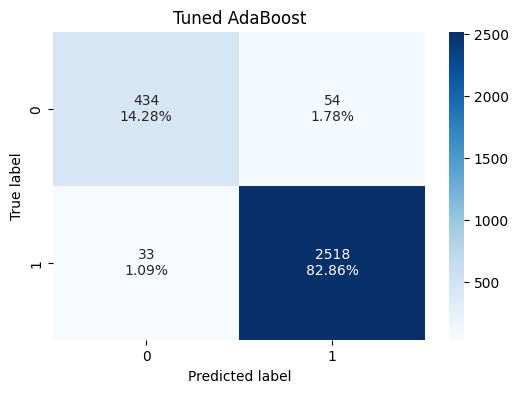

In [308]:
confusion_matrix_sklearn("Tuned AdaBoost", best_adaboost, X_test, y_test)

#### Tuned `XGBoost`

##### `RandomizedSearchCV`

In [309]:
xgb_grid = {
   "n_estimators": [50, 100, 200, 300],
   "max_depth": randint(3, 10),
   "min_child_weight": [1, 2, 4],
   "gamma": uniform(0, 0.5),
   "subsample": [0.6, 0.8, 1.0],
   "colsample_bytree": [0.6, 0.8, 1.0],
   "learning_rate": [0.01, 0.05, 0.1],
   "colsample_bylevel": [0.6, 0.8, 1.0]
}


grid_obj = RandomizedSearchCV(
   estimator=XGBClassifier(),
   param_distributions=xgb_grid,
   scoring='f1',
   n_iter=50,
   cv=5,
   verbose=3,
   random_state=42,
   n_jobs=1)

grid_obj.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV 1/5] END colsample_bylevel=1.0, colsample_bytree=0.6, gamma=0.0917173949330819, learning_rate=0.01, max_depth=7, min_child_weight=4, n_estimators=100, subsample=1.0;, score=0.954 total time=   0.2s
[CV 2/5] END colsample_bylevel=1.0, colsample_bytree=0.6, gamma=0.0917173949330819, learning_rate=0.01, max_depth=7, min_child_weight=4, n_estimators=100, subsample=1.0;, score=0.952 total time=   0.1s
[CV 3/5] END colsample_bylevel=1.0, colsample_bytree=0.6, gamma=0.0917173949330819, learning_rate=0.01, max_depth=7, min_child_weight=4, n_estimators=100, subsample=1.0;, score=0.957 total time=   0.2s
[CV 4/5] END colsample_bylevel=1.0, colsample_bytree=0.6, gamma=0.0917173949330819, learning_rate=0.01, max_depth=7, min_child_weight=4, n_estimators=100, subsample=1.0;, score=0.960 total time=   0.1s


[CV 5/5] END colsample_bylevel=1.0, colsample_bytree=0.6, gamma=0.0917173949330819, learning_rate=0.01, max_depth=7, min_child_weight=4, n_estimators=100, subsample=1.0;, score=0.952 total time=   0.1s
[CV 1/5] END colsample_bylevel=1.0, colsample_bytree=1.0, gamma=0.22962444598293358, learning_rate=0.01, max_depth=6, min_child_weight=4, n_estimators=100, subsample=0.6;, score=0.963 total time=   0.1s
[CV 2/5] END colsample_bylevel=1.0, colsample_bytree=1.0, gamma=0.22962444598293358, learning_rate=0.01, max_depth=6, min_child_weight=4, n_estimators=100, subsample=0.6;, score=0.962 total time=   0.1s
[CV 3/5] END colsample_bylevel=1.0, colsample_bytree=1.0, gamma=0.22962444598293358, learning_rate=0.01, max_depth=6, min_child_weight=4, n_estimators=100, subsample=0.6;, score=0.966 total time=   0.1s
[CV 4/5] END colsample_bylevel=1.0, colsample_bytree=1.0, gamma=0.22962444598293358, learning_rate=0.01, max_depth=6, min_child_weight=4, n_estimators=100, subsample=0.6;, score=0.969 total

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                        'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x29fdefb00>,
                                        'learning_rate': [0.01, 0.05, 0.1],
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x29fdee900>,
                                        'min_child_weight': [1, 2, 4],
                                        'n_estimators': [50, 100, 200, 300],
                                        'subsample': [0.6, 0.8, 1.0]},
                   random_state=42, scoring='f1', verbose=3)

In [310]:
best_xgb = grid_obj.best_estimator_
best_xgb

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=0.6, colsample_bynode=None,
              colsample_bytree=1.0, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.3022086896389086, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [311]:
show_scores(best_xgb)

{'Training Recall': 1.0,
 'Testing Recall': 0.9870638965111721,
 'Training Precision': 1.0,
 'Testing Precision': 0.9774844720496895,
 'Training F1 Score': 1.0,
 'Testing F1 Score': 0.982250828944802}

In [312]:
best_xgb_model_scores = show_scores(best_xgb)
best_xgb_model_scores = list(('Tuned XGBoost', *best_xgb_model_scores.values()))
comp_xgb = pd.DataFrame([best_xgb_model_scores], columns=['Model', 'Training Recall', 'Testing Recall', 'Training Precision', 'Testing Precision', 'Training F1 Score', 'Testing F1 Score'], index=['Random Forest'])
comp_df = pd.concat([comp_df, comp_xgb], ignore_index=True)

In [ ]:
prior_best_xgb = XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=0.6, colsample_bynode=None,
              colsample_bytree=1.0, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.3022086896389086, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=1, missing=np.nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=None).fit(X_train, y_train)

**Best Parameters for XGBoost**

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=1.0, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.0917173949330819, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

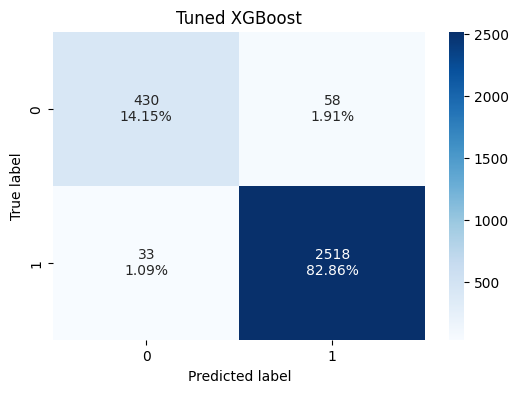

In [314]:
confusion_matrix_sklearn("Tuned XGBoost", best_xgb, X_test, y_test)

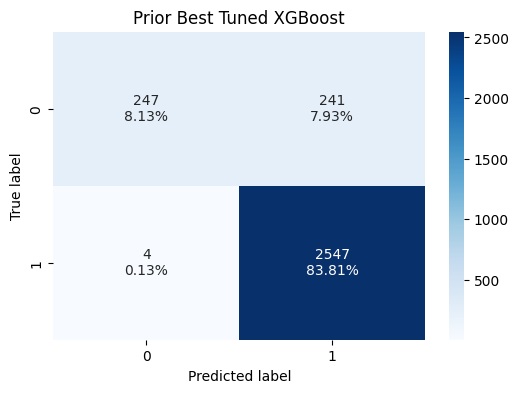

In [315]:
confusion_matrix_sklearn("Prior Best Tuned XGBoost", prior_best_xgb, X_test, y_test)

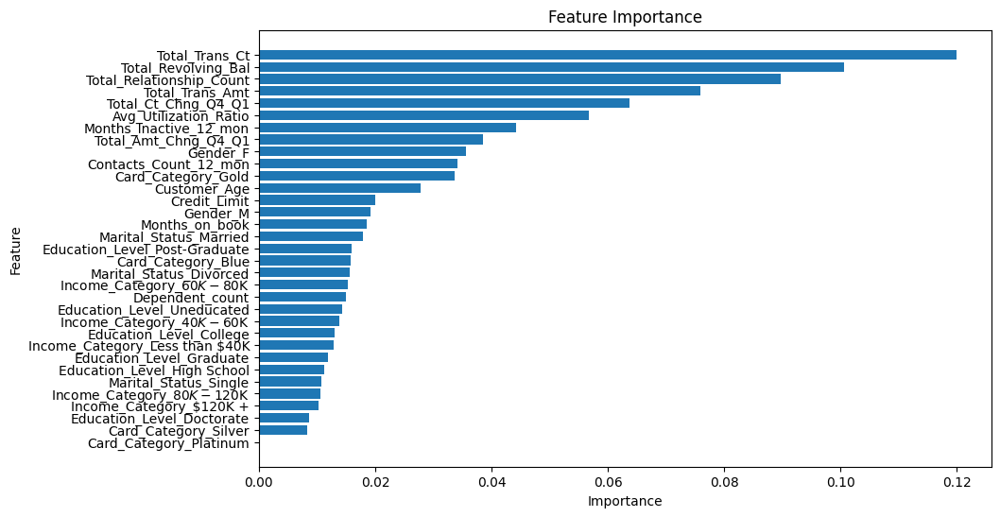

In [316]:
best_xgb.fit(X, y)

# Get feature importances
importances = best_xgb.feature_importances_

# Create a DataFrame with feature names and importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importances = feature_importances.sort_values('Importance', ascending=True)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

##### `Optuna`

In [317]:
# creating new test set for optuna without stratify
X_trainval, X_valid, y_trainval, y_valid = train_test_split(X, y, test_size = 0.3, random_state=42)

In [318]:
#Optuna hyperparameter optimizer without pruning
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 8, 600),
        'gamma': trial.suggest_int('gamma', 5, 25),
        'subsample': trial.suggest_float('subsample', 0.5, 1, step=0.1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1.0, step=0.1),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.015, log=True),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.3, 1.0, step=0.1),
        'lambda': trial.suggest_loguniform('lambda', 7.0, 20.0),
        'alpha': trial.suggest_loguniform('alpha', 7.0, 20.0),
        'eta': trial.suggest_discrete_uniform('eta', 0.3, 0.7, 0.1),
        'random_state': 42
    }
    model = XGBClassifier(**params)
    model.fit(X_trainval, y_trainval, eval_set=[(X_valid, y_valid)], verbose=False)
    y_pred = model.predict(X_valid)
    f1 = f1_score(y_valid, y_pred)
    return f1

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))
print("Best trial:")
trial = study.best_trial

print("  Value: {:.3f}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-19 14:46:03,679] A new study created in memory with name: no-name-06904bb8-8d68-40fb-992d-6fa1ffe1103f
[I 2024-04-19 14:46:04,139] Trial 0 finished with value: 0.9111429595127195 and parameters: {'n_estimators': 327, 'max_depth': 5, 'min_child_weight': 564, 'gamma': 10, 'subsample': 1.0, 'colsample_bytree': 0.8, 'learning_rate': 0.011863047788958666, 'colsample_bylevel': 0.4, 'lambda': 7.950718427598744, 'alpha': 7.269198086648688, 'eta': 0.7}. Best is trial 0 with value: 0.9111429595127195.
[I 2024-04-19 14:46:04,410] Trial 1 finished with value: 0.9111429595127195 and parameters: {'n_estimators': 106, 'max_depth': 3, 'min_child_weight': 294, 'gamma': 5, 'subsample': 0.6, 'colsample_bytree': 0.3, 'learning_rate': 0.010320790487481541, 'colsample_bylevel': 0.5, 'lambda': 7.861851373136102, 'alpha': 11.328949036151347, 'eta': 0.5}. Best is trial 0 with value: 0.9111429595127195.
[I 2024-04-19 14:46:04,861] Trial 2 finished with value: 0.9111429595127195 and parameters: {'n_es

Number of finished trials: 200
Best trial:
  Value: 0.976
  Params: 
    n_estimators: 692
    max_depth: 10
    min_child_weight: 8
    gamma: 5
    subsample: 0.9
    colsample_bytree: 1.0
    learning_rate: 0.012042724077793634
    colsample_bylevel: 1.0
    lambda: 13.175267393608951
    alpha: 8.053446246392612
    eta: 0.4


In [319]:
print("Best parameters:", study.best_params)
best_params = study.best_params
best_xgb_optuna = xgb.XGBClassifier(**best_params, random_state=42)
best_xgb_optuna.fit(X_trainval, y_trainval)
y_pred = best_xgb_optuna.predict(X_valid)


Best parameters: {'n_estimators': 692, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 5, 'subsample': 0.9, 'colsample_bytree': 1.0, 'learning_rate': 0.012042724077793634, 'colsample_bylevel': 1.0, 'lambda': 13.175267393608951, 'alpha': 8.053446246392612, 'eta': 0.4}


In [320]:
train_preds = best_xgb_optuna.predict(X_trainval)
val_preds = best_xgb_optuna.predict(X_valid)

scores = {"Training Recall": recall(y_trainval, train_preds),
          "Testing Recall": recall(y_valid, val_preds),
          "Training Precision": precision_score(y_trainval, train_preds),
          "Testing Precision": precision_score(y_valid, val_preds),
          "Training F1 Score": f1_score(y_trainval, train_preds),
          "Testing F1 Score": f1_score(y_valid, val_preds),}

scores

{'Training Recall': 0.9899278160147725,
 'Testing Recall': 0.9870232009437672,
 'Training Precision': 0.9721397955819321,
 'Testing Precision': 0.9657560600230858,
 'Training F1 Score': 0.9809531730849206,
 'Testing F1 Score': 0.9762738234150136}

In [321]:
best_xgb_optuna_scores = list(('Tuned XGBoost with Optuna', *scores.values()))
comp_xgb = pd.DataFrame([best_xgb_optuna_scores], columns=['Model', 'Training Recall', 'Testing Recall', 'Training Precision', 'Testing Precision', 'Training F1 Score', 'Testing F1 Score'], index=['Random Forest'])
comp_df = pd.concat([comp_df, comp_xgb], ignore_index=True)

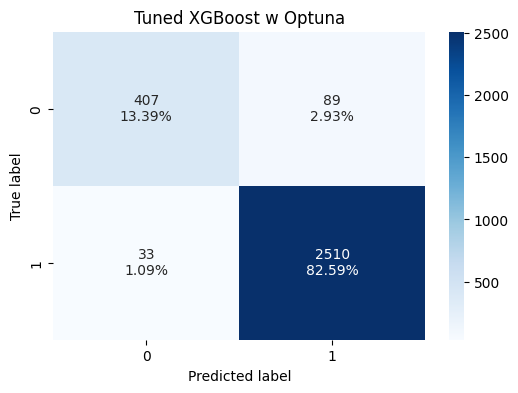

In [322]:
confusion_matrix_sklearn("Tuned XGBoost w Optuna", best_xgb_optuna, X_valid, y_valid)

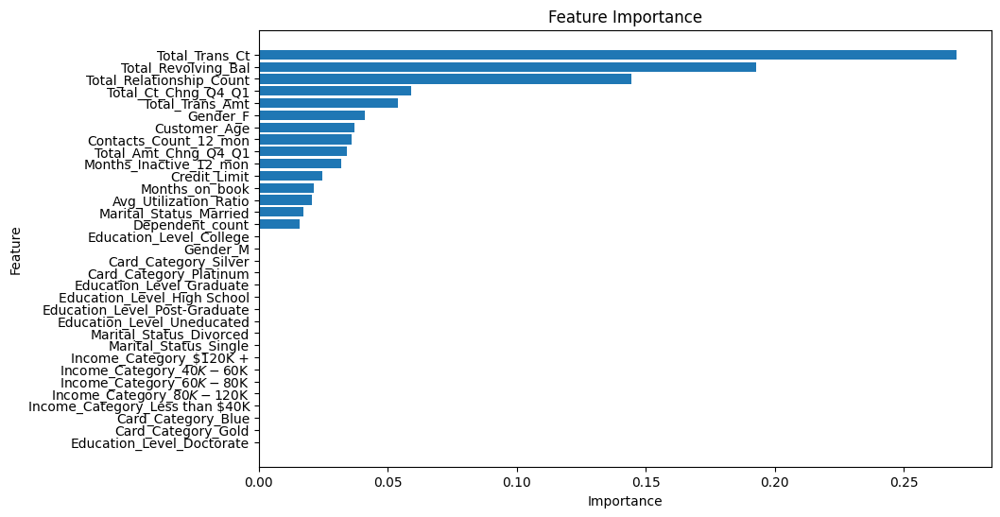

In [323]:
best_xgb_optuna.fit(X, y)

# Get feature importances
importances = best_xgb_optuna.feature_importances_

# Create a DataFrame with feature names and importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importances = feature_importances.sort_values('Importance', ascending=True)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

##### `Stacking Score`

In [324]:
stacking_model = StackingClassifier(estimators=[('best_regression', best_regression), ('best_adaboost', best_adaboost)], final_estimator=best_xgb)
stacking_model.fit(X_train, y_train)


StackingClassifier(estimators=[('best_regression',
                                RandomForestClassifier(max_features=0.5,
                                                       min_samples_split=16,
                                                       n_estimators=550,
                                                       n_jobs=-1,
                                                       random_state=42)),
                               ('best_adaboost',
                                AdaBoostClassifier(learning_rate=0.3,
                                                   n_estimators=421,
                                                   random_state=42))],
                   final_estimator=XGBClassifier(base_score=None, booster=None,
                                                 callbacks=None,
                                                 colsample_bylevel=0.6,
                                                 colsampl...
                                                 gamma=0.3022086896389086,
                                                 grow_policy=None,
                                                 importance_type=None,
                                                 interaction_constraints=None,
                                                 learning_rate=0.1,
                                                 max_bin=None,
                                                 max_cat_threshold=None,
                                                 max_cat_to_onehot=None,
                                                 max_delta_step=None,
                                                 max_depth=5, max_leaves=None,
                                                 min_child_weight=1,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 multi_strategy=None,
                                                 n_estimators=300, n_jobs=None,
                                                 num_parallel_tree=None,
                                                 random_state=None, ...))

In [325]:
stacking_score = f1_score(y_train, stacking_model.predict(X_train))
print("Stacking - F1 Training: {}".format(stacking_score))

stacking_val = f1_score(y_test, stacking_model.predict(X_test))
print("Stacking - F1 Test: {}".format(stacking_val))

Stacking - F1 Training: 0.9862462260986247
Stacking - F1 Test: 0.97890625


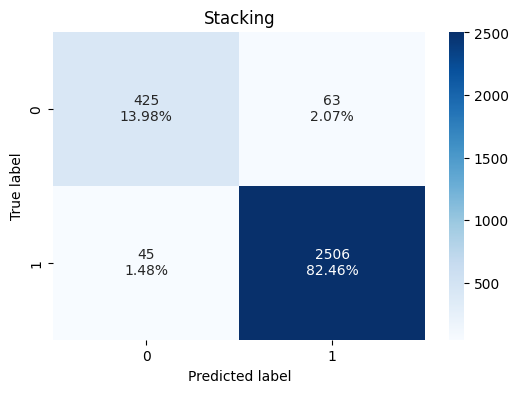

In [326]:
confusion_matrix_sklearn("Stacking", stacking_model, X_test, y_test)

In [327]:
show_scores(stacking_model)

{'Training Recall': 0.9884014120020171,
 'Testing Recall': 0.982359858878871,
 'Training Precision': 0.9841004184100418,
 'Testing Precision': 0.9754768392370572,
 'Training F1 Score': 0.9862462260986247,
 'Testing F1 Score': 0.97890625}

In [328]:
stacking_model_scores = show_scores(stacking_model)
stacking_model_scores = list(('Stacking with Tuned', *stacking_model_scores.values()))
comp_stacking = pd.DataFrame([stacking_model_scores], columns=['Model', 'Training Recall', 'Testing Recall', 'Training Precision', 'Testing Precision', 'Training F1 Score', 'Testing F1 Score'], index=['Random Forest'])
comp_df = pd.concat([comp_df, comp_stacking], ignore_index=True)

<a id=9></a>
## Model Comparison and Final Model Selection

**Overview**

The final models chose were RandomForest, AdaBoost, and XGBoost classifiers, with two additional models as an exercise utilizing `Optuna` with XGBoost, as well as Stacking to see if we can yield better results leveraging all of the models in combination. 

**Measuring the Models**
Initially, the idea was to focus on reducing any false negatives by maximizing `Recall` score. However, with the exception of the `XGBoost` Model tuned with `RandomizedSearchCV`, the maximizing of `Recall` did not yield any appropriately identified Customers who won't churn giving all the data as False Positives. Although this would still yield a result that the Bank could target Customers who are at risk of attrition, it could use up unnecessary resources. Therefore, there needs to be a balance between `F1` score, and `Recall`.

In [329]:
comp_df.T

,0,1,2,3,4
Model,Tuned Random Forest,Tuned AdaBoost,Tuned XGBoost,Tuned XGBoost with Optuna,Stacking with Tuned
Training Recall,0.99563,0.985712,1.0,0.989928,0.988401
Testing Recall,0.985496,0.985496,0.987064,0.987023,0.98236
Training Precision,0.989641,0.977496,1.0,0.97214,0.9841
Testing Precision,0.966923,0.97291,0.977484,0.965756,0.975477
Training F1 Score,0.992626,0.981587,1.0,0.980953,0.986246
Testing F1 Score,0.976121,0.979163,0.982251,0.976274,0.978906


**Model Choice: `XGBoost` using `RandomizedSearchCV`**

As I discussed above, the model that reduces the most amount of false negatives isn't necessarily the best since it can take considerable resources in order to deploy necessary initiatives to prevent Customer churn. What's more important is the model that can balance the false negatives, identifying more true negatives, while minimizing the false positives.

<a id=9.1></a>
### Test set final performance

In [330]:
chosen_model = best_xgb.fit(X_test, y_test)
test_performance = {
    "Testing Recall": recall_score(y_test, chosen_model.predict(X_test)),
    "Testing Precision": precision_score(y_test, chosen_model.predict(X_test)),
    "Testing F1 Score": f1_score(y_test, chosen_model.predict(X_test)),
}

test_performance


{'Testing Recall': 1.0, 'Testing Precision': 1.0, 'Testing F1 Score': 1.0}

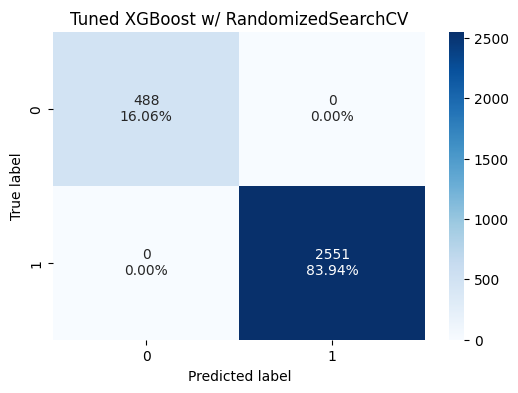

In [331]:
confusion_matrix_sklearn("Tuned XGBoost w/ RandomizedSearchCV", chosen_model, X_test, y_test)

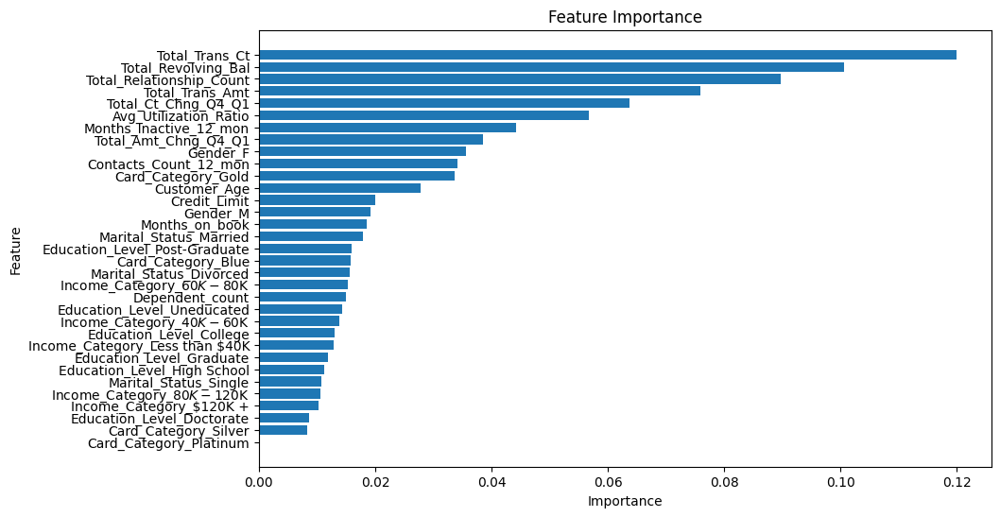

In [332]:
chosen_model.fit(X, y)

# Get feature importances
importances = chosen_model.feature_importances_

# Create a DataFrame with feature names and importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importances = feature_importances.sort_values('Importance', ascending=True)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

<a id=10></a>
# Business Insights and Conclusions

***

#### **Main Conclusion**

The biggest revelation from the data is that the less a Customer utilizes the services of the Credit Card company, the more likely they're to close their account(s). This is evidence by the chosen model's display of `Feature Importance`, which illustrates what data points the model found most useful for determiining and identifying with ~99% probability whether a Customer is to remain with the bank or actually leave. 

#### **Understanding the Chosen Model**



**Other Insights from Data**

* As discussed before, the more of a relationship the Customer has with the bank, the less likely they are to close their credit account. This is evidenced by the data points of the amount of transactions the Customer has (`Total_Trans_Ct`), the revolving balance (`Total_Revolving_Bal`), the average card utilizaiton ratio (how much the Customer spent compared to their credit limit - `Avg_Utilization_Ratio`), and their transaction amount in the previous 12 months (`Total_Trans_Amt`). In each of the final three models that were evaluated for best use, each of these data points were listed as among the most important. It's important to focus on the following in relation to each:
    * Number of Transactions (`Total_Trans_Ct`): Customers at risk for attrition had a lower overall number of transactions. Even with the inclusion of the outlier attrited customers, the value never exceeded 100 total transactions, whereas existing customers were as high as round 140, with a majority hovering around 70.
    * Revolving Balance (`Total_Revolving_Bal`): This is a harder one to keep an eye on as the range for both existing and attrited customers goes from $0 to $2,500. However, about 75% of attrited Customers don't exceed around $1300. This datapoint would need further investigation, as available credit limit could also have to do with this.
    * Credit Percent Usage (`Avg_Utilization_Ratio`): About 75% of attrited Customers keep their overall utilization low (around 22%), but there are some that go as high as 100% utilization. Those exceeding around 58% are considered outlier Customers, and would need to understand further. Again, much like the other data points, low utilization ratio could be considered fiscal responsibility, or the fact that these Customers may prefer other methods of payment or competitor credit cards as their preferred use, which would lend them to close their account.
    * Total Amount Transacted (`Total_Trans_Amt`): As with all the other datapoints, the more that's transacted, the least likely a Customer is to leave.
* Outside of the models the amount of contacts with a customer also appears to be a great indicaction of potential attrition. As more contacts are made, the more likely they are to leave with as much as 100% of Customers with 6 contacts leaving. Below are the probabilities of attrition below:
    * 0 - 1.8%
    * 1 - 7.8%
    * 2 - 14.3%
    * 3 - 25.2%
    * 4 - 29.2%
    * 5 - 50.4%
    * 6 - 100%

**Further Research Needed**

* **Important**: What needs to be understood is the amount of resources deployed to retain Customers in relation to **Customer Lifetime Value**. The reason being is that the models trained is focused on what is called Recall, which is to reduce the most amount of false negatives as possible. However, the danger is that by identifying all Customers that would churn, but don't actually, you get a lot of False Positives that would require attention. By way of example, initial `RandomForest` models focused in 